In [1]:
import os
import monai
import torch
import torch.nn as nn
import torch.optim as optim
from monai.networks.nets import UNet
from monai.data import DataLoader, CacheDataset, ImageDataset, Dataset, image_reader
from monai.data.utils import pad_list_data_collate
from monai.transforms import Compose, ScaleIntensity, ToTensor,LoadImaged, ScaleIntensityd, ToTensord,EnsureChannelFirstd
import SimpleITK as sitk
from monai.data.image_reader import ITKReader
from monai.losses import DiceLoss
from monai.metrics import MSEMetric
import dataset
from dataset import PelvisDataset
import numpy as np
import sklearn
from monai.metrics import compute_hausdorff_distance
from UNETR import UNETR
from scipy.ndimage import label
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from scipy.spatial.distance import cdist
from scipy import ndimage
import ipywidgets as widgets
from ipywidgets import interact


2024-01-10 16:20:59.474748: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-10 16:21:00.102370: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# CLOSEST SURFACE POINT AND CROPPED IMAGES

P_1765645_GIN.nrrd


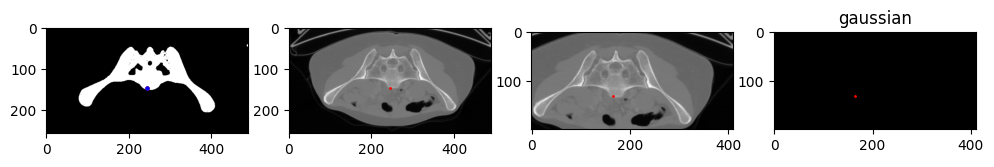

P_1572096_ANTROP.nrrd


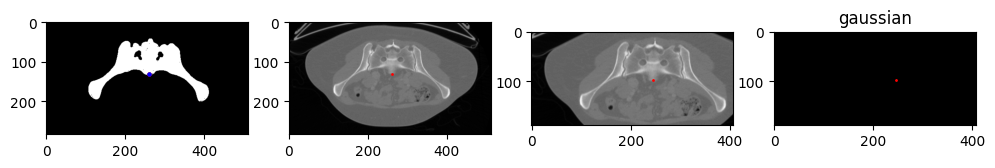

P_10535603_GIN.nrrd


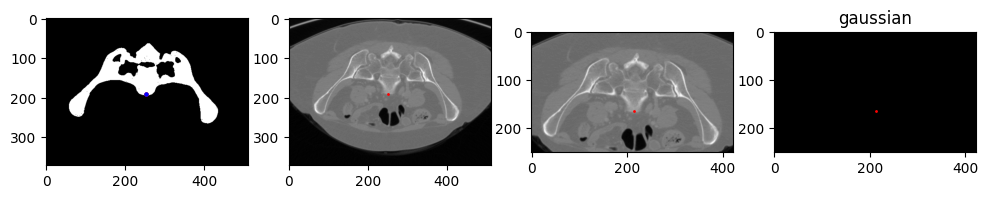

P_808211848_GIN.nrrd


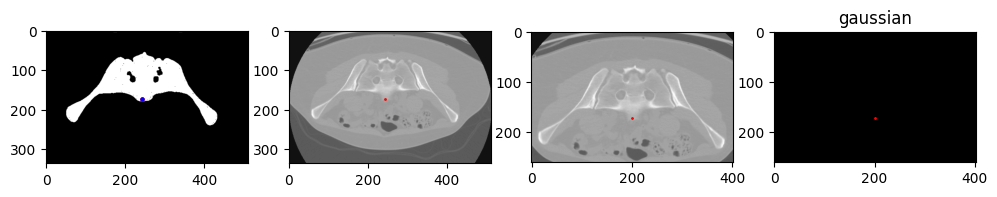

P_10061362_GIN.nrrd


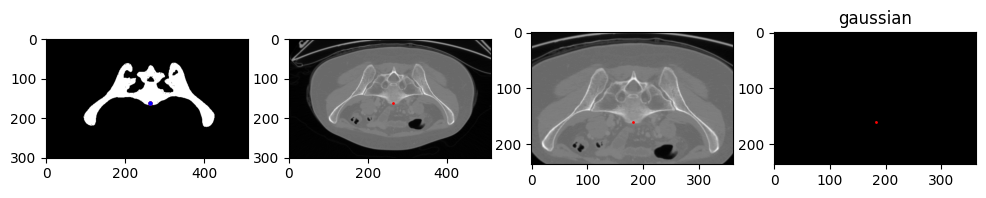

P_10279644_ANTROP.nrrd


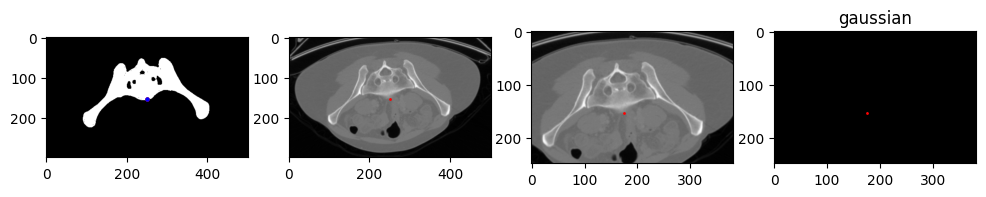

P_2066635_ANTRO.nrrd


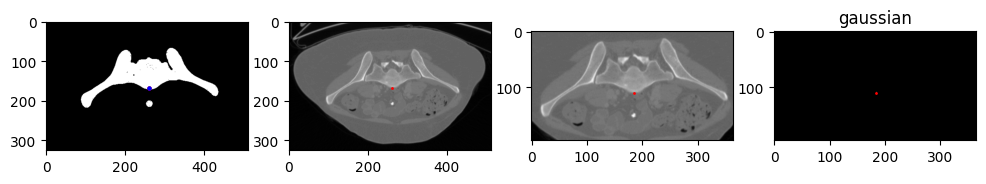

P_2197057_ANTROP.nrrd


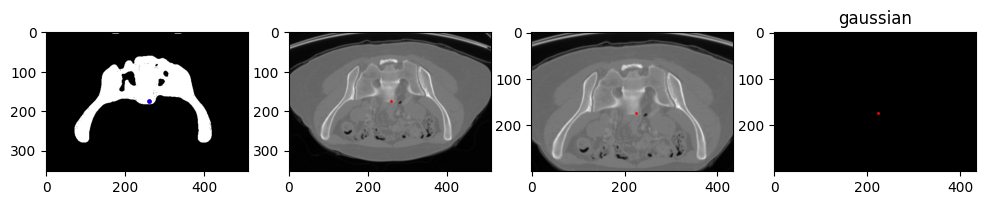

P_2043819_ANDRO.nrrd


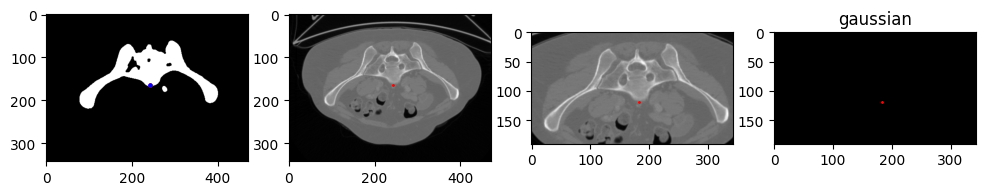

P_1195472_ANTROP.nrrd


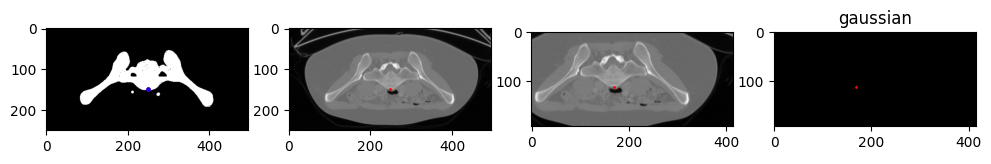

P_1165093_ANTROP.nrrd
P_10182352_GIN.nrrd


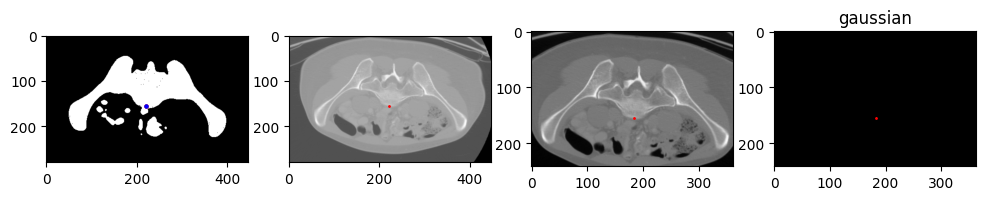

P_2241943_ANTROP.nrrd


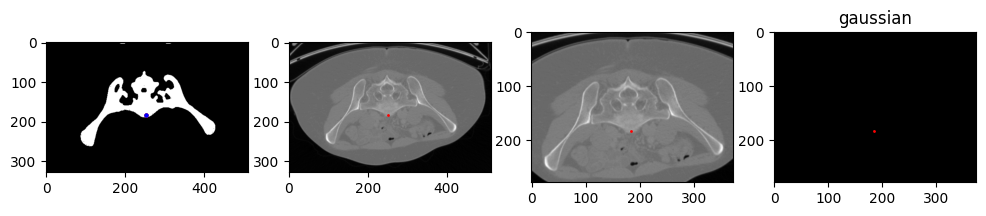

P_840104562_ANTROP.nrrd


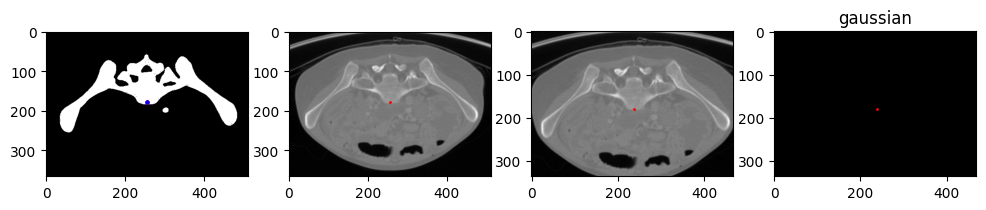

P_2418993_GIN.nrrd


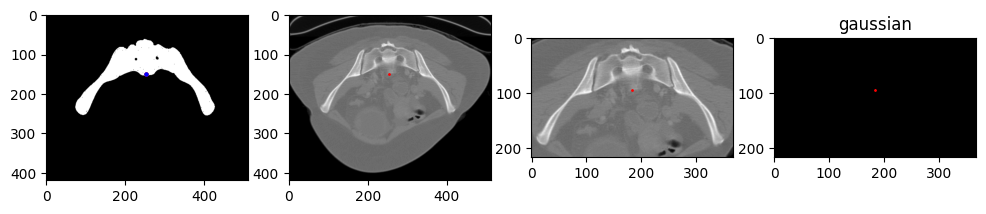

P_840114360_ANTROP.nrrd


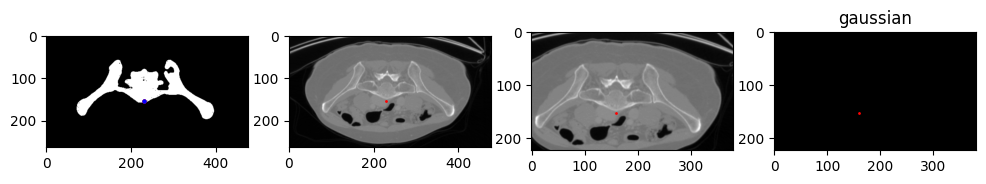

P_802351174_ANTROP.nrrd


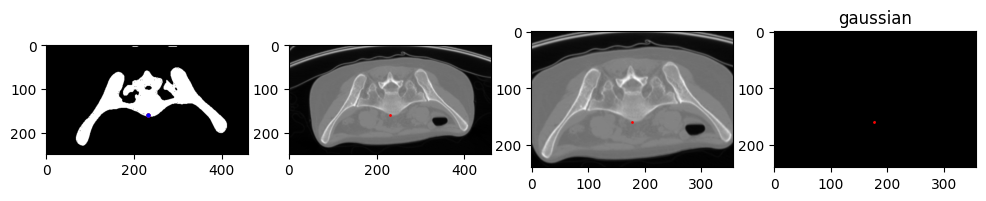

P_2379678_ANTROP.nrrd


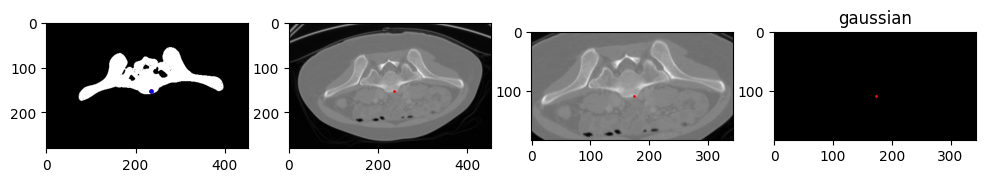

P_10253637_ANTROP.nrrd


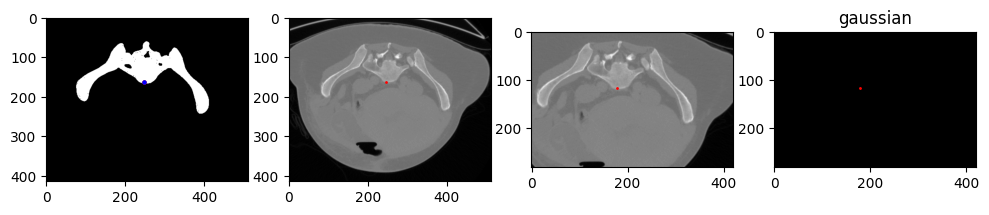

P_10265450_ANTROP.nrrd


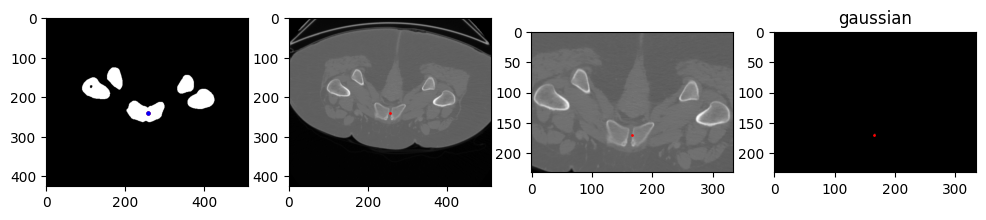

P_1480679_ANTROP.nrrd


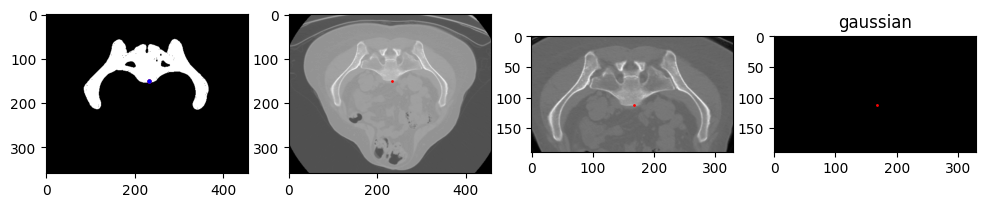

P_2387418_GIN.nrrd


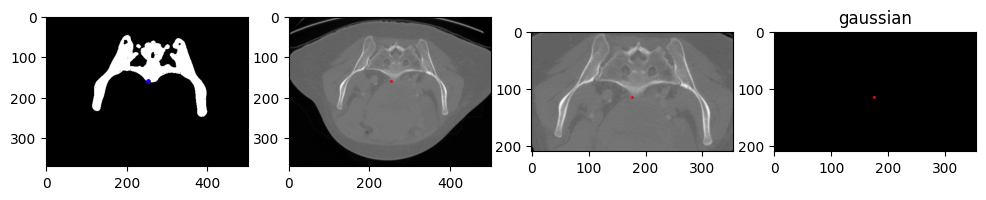

P_10208792_ANDRO.nrrd


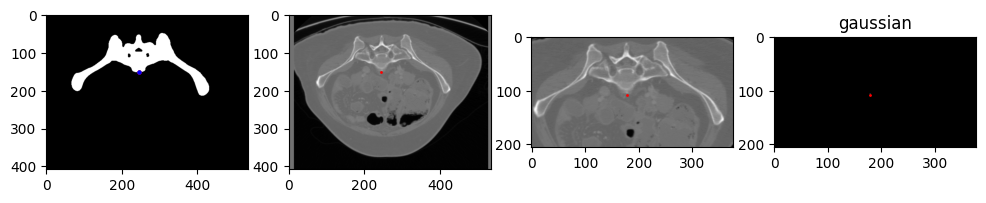

P_10190176_ANTROP.nrrd


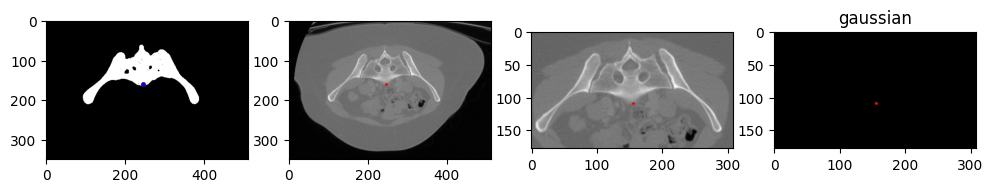

P_2111864_ANTROP.nrrd


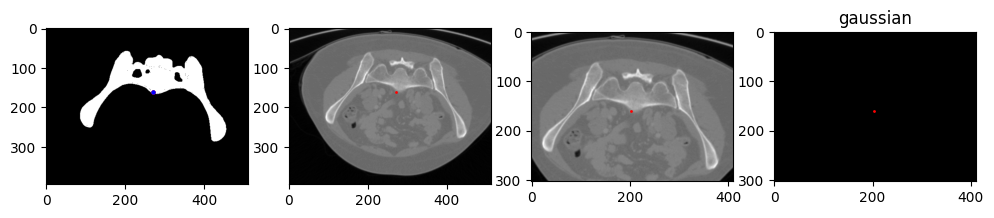

P_1571575_GIN.nrrd


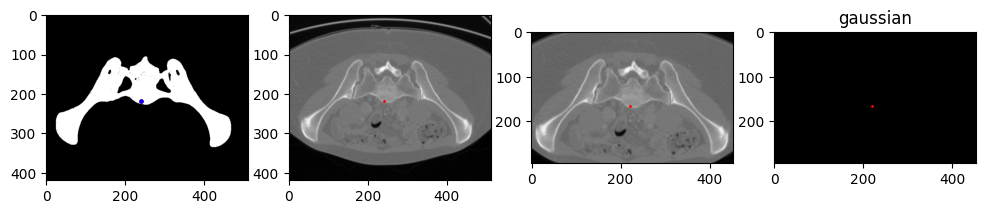

P_10055401_GIN.nrrd


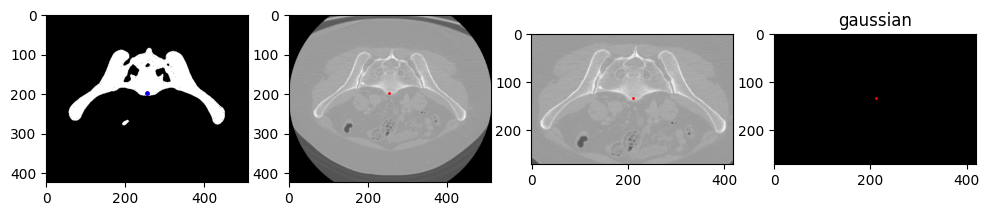

P_1715822_ANTROP.nrrd


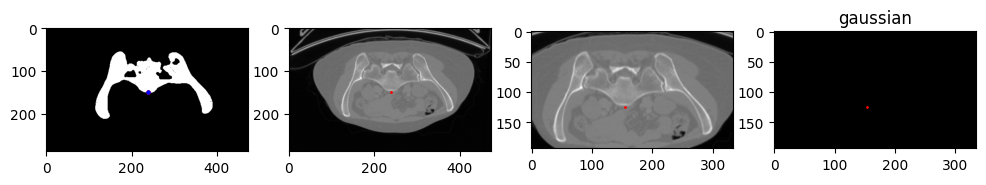

P_840121405_GIN.nrrd


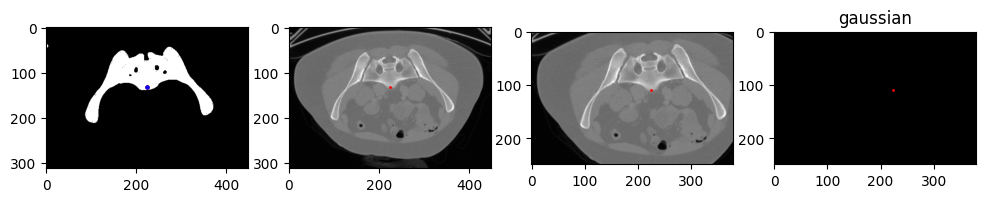

P_1683063_ANTROP.nrrd


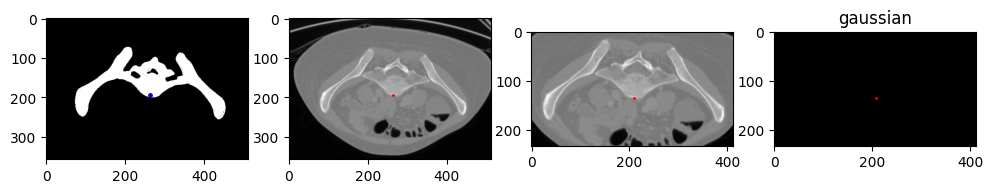

P_1683587_ANTROP.nrrd


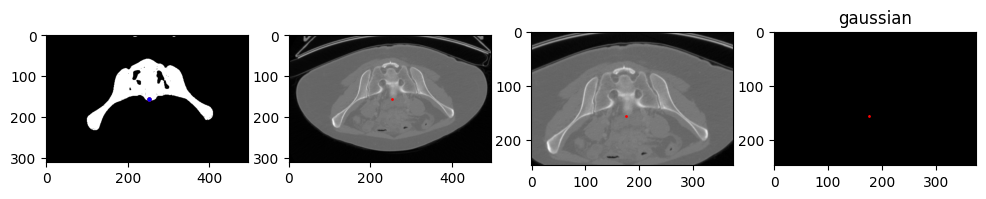

P_2370576_GIN.nrrd


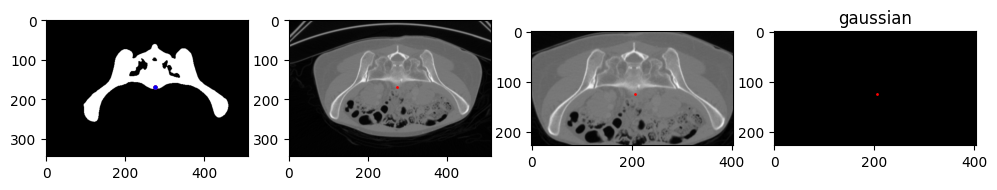

P_840248498_ANTROP.nrrd


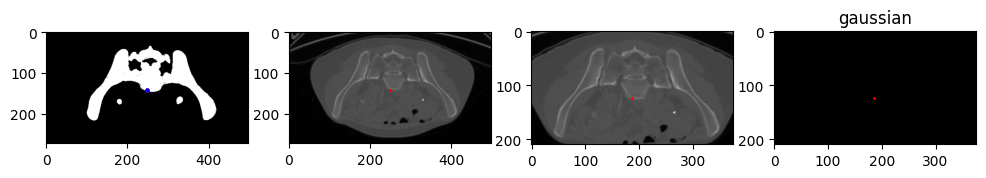

P_10390193_GIN.nrrd


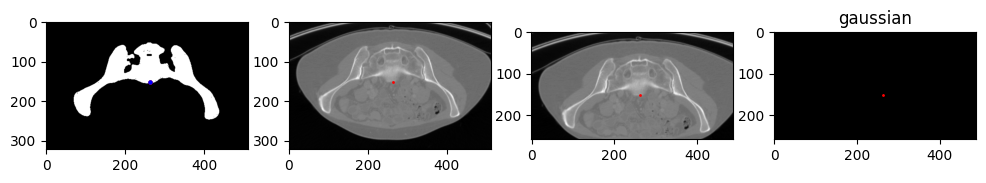

P_1905095_GIN.nrrd


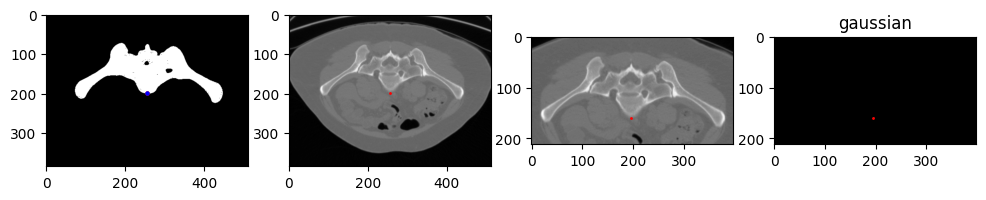

P_2002362_ANTROP.nrrd


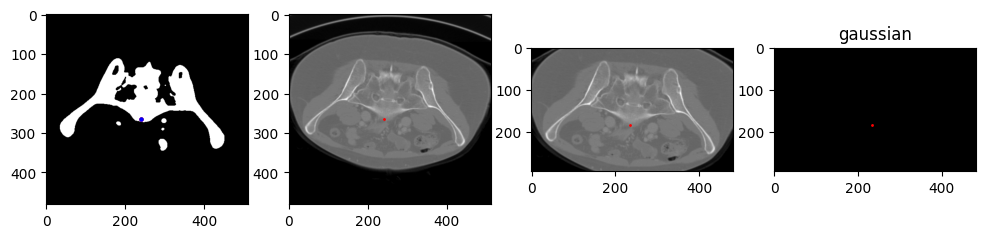

P_1132495_ANTROP.nrrd


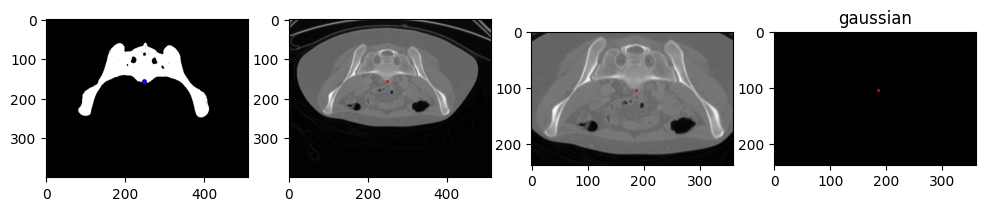

P_1444487_ANTROP.nrrd


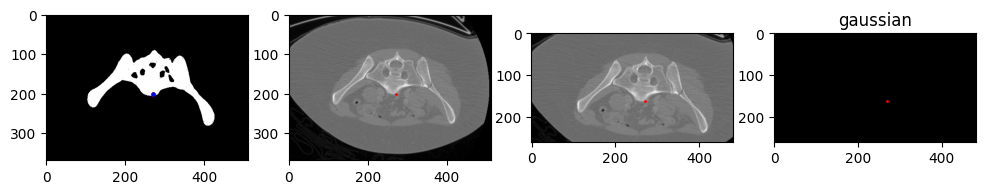

P_1716840_ANTROP.nrrd


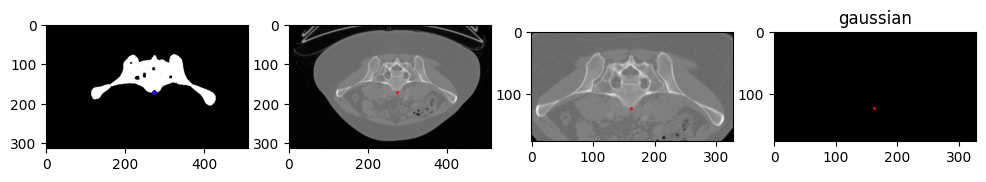

P_1825137_PLATI.nrrd


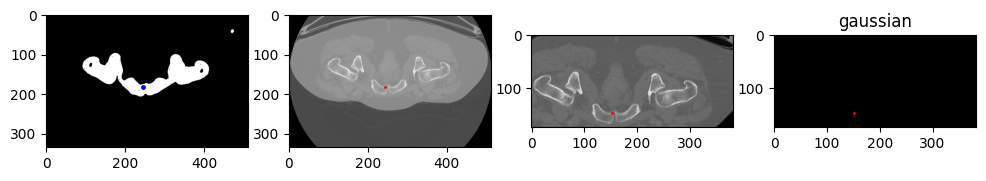

P_2369281_ANTROP.nrrd


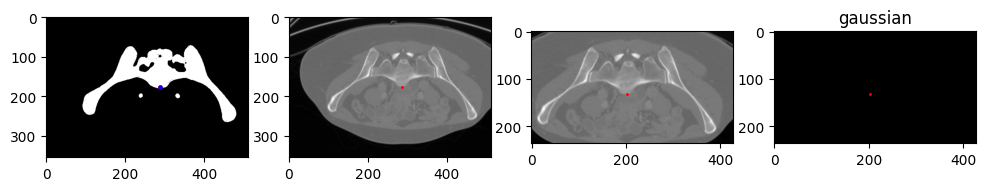

P_2319187_GIN.nrrd


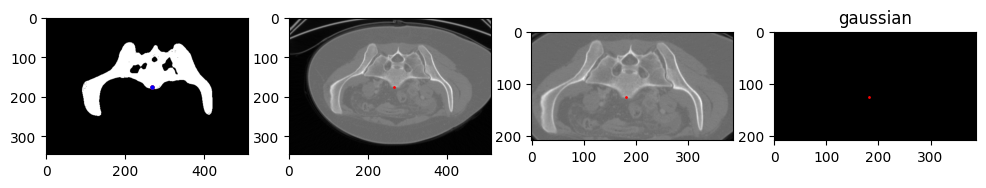

P_1993084_ANTROP.nrrd


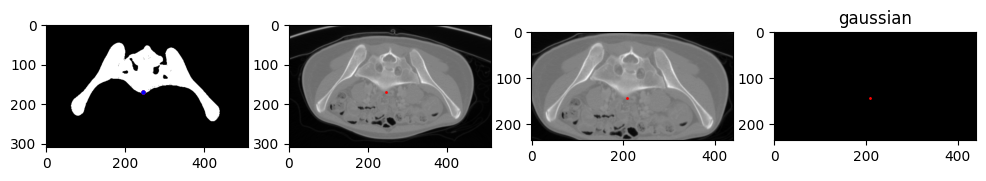

P_1612231_GIN.nrrd


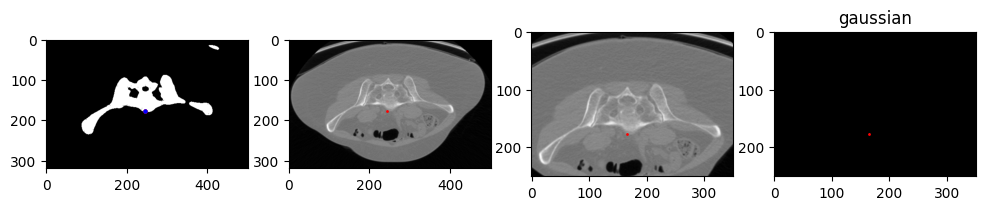

P_2146763_GIN.nrrd


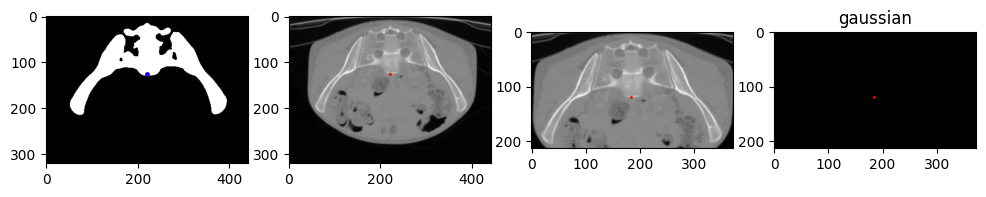

P_2039080_GIN.nrrd


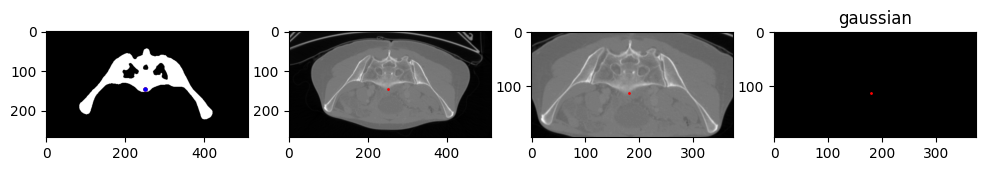

P_10550586_ANTROP.nrrd


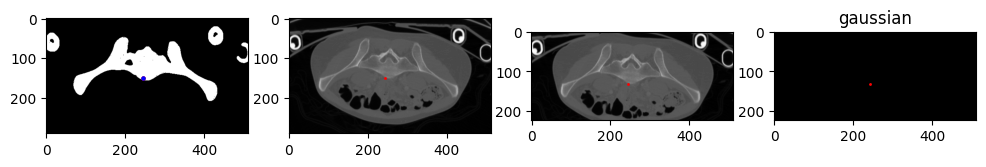

P_1427769_GIN.nrrd


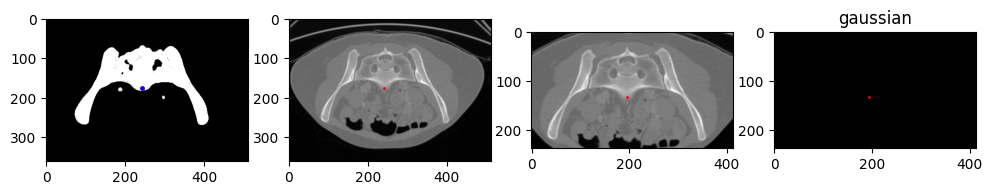

P_10292632_ANTROP.nrrd


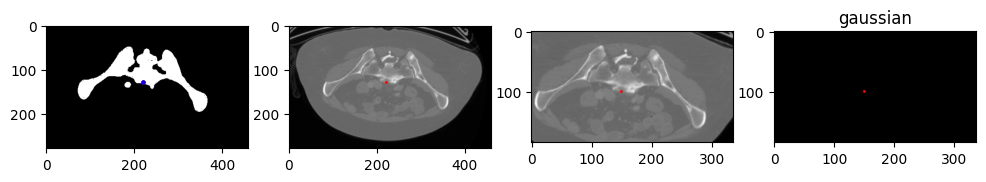

P_2156592_ANTROP.nrrd


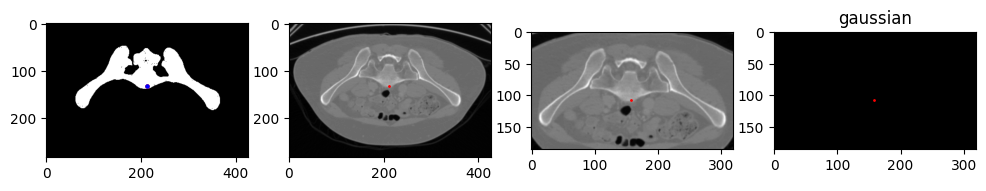

P_10860322_GIN.nrrd


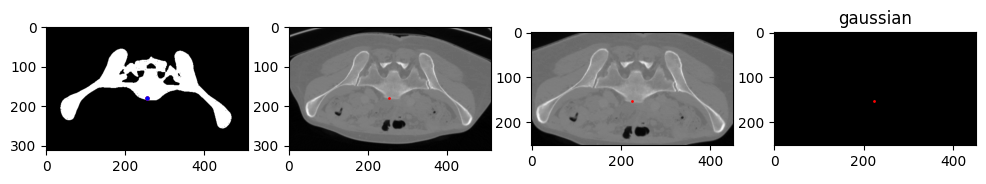

P_2196069_ANTROP.nrrd


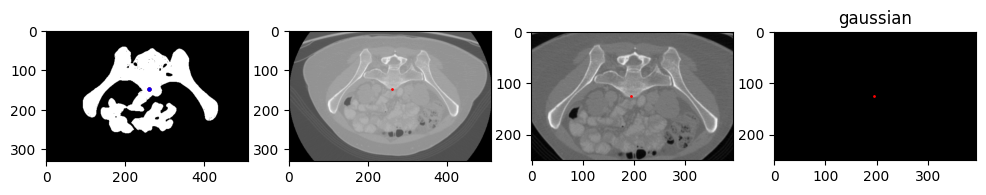

P_1874278_GIN.nrrd


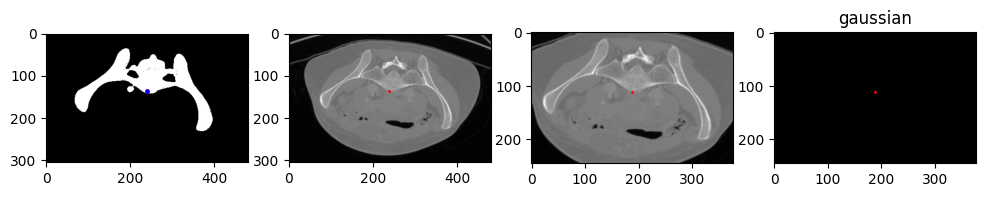

P_840109842_GIN.nrrd


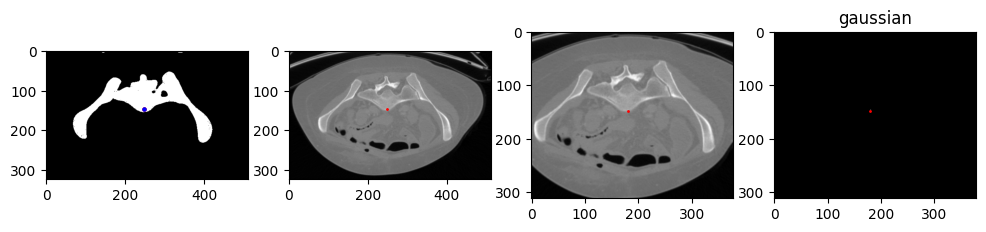

P_808704728_ANTROP.nrrd


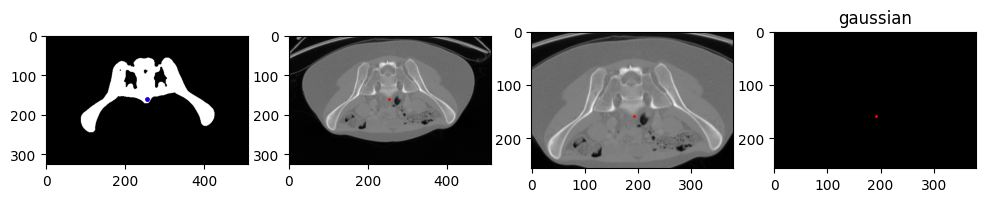

P_10255365_GIN.nrrd


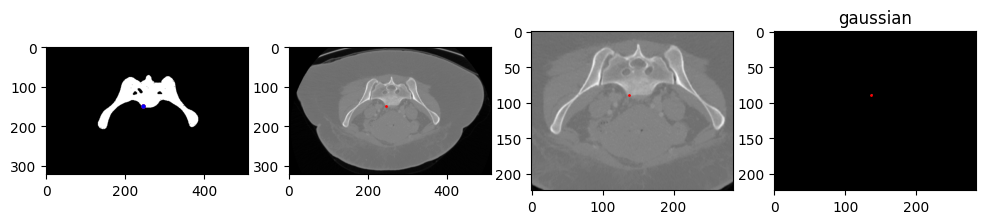

P_10273428_GIN.nrrd


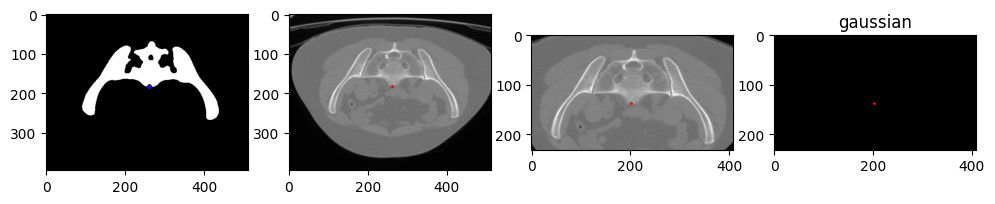

P_1663679_ANTROP.nrrd


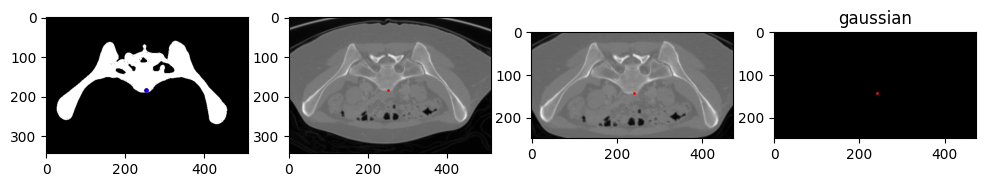

P_2046474_GIN.nrrd


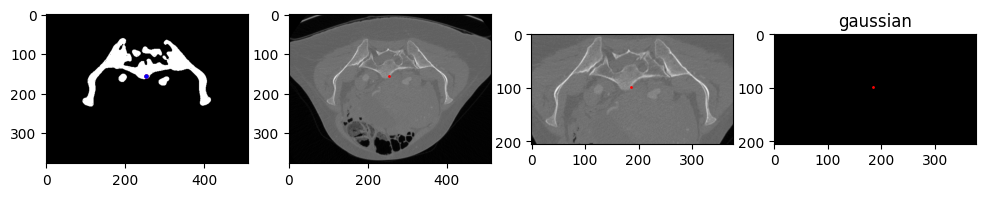

P_1796248_ANTROP.nrrd


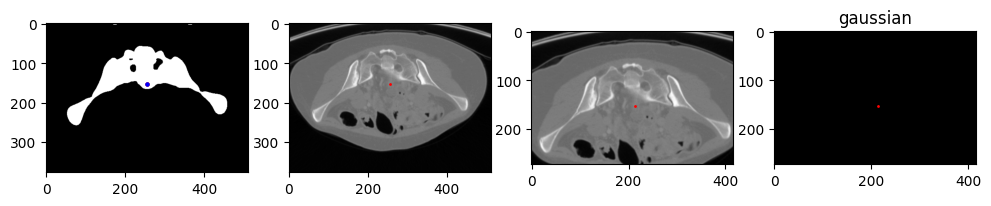

P_10240629_GIN.nrrd


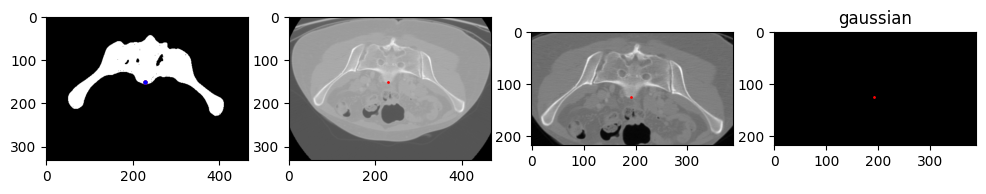

P_840131653_ANDRO.nrrd


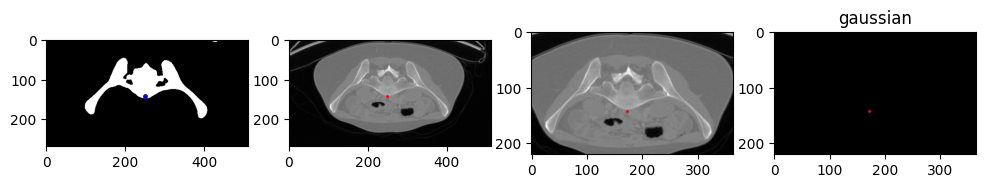

P_2089803_GIN.nrrd


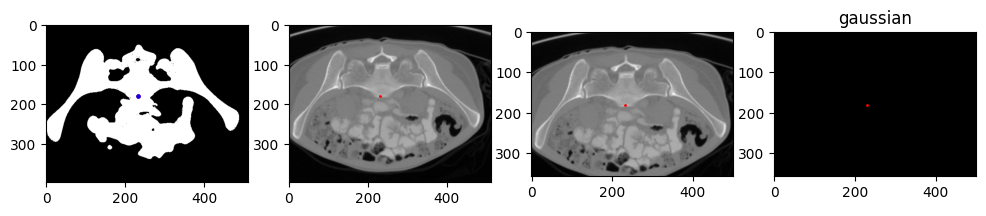

P_2114245_GIN.nrrd


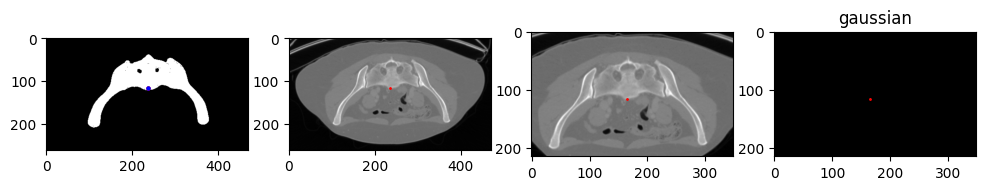

P_808475095_GIN.nrrd


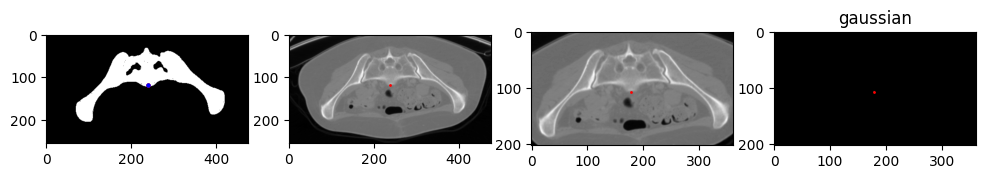

P_2133072_GIN.nrrd


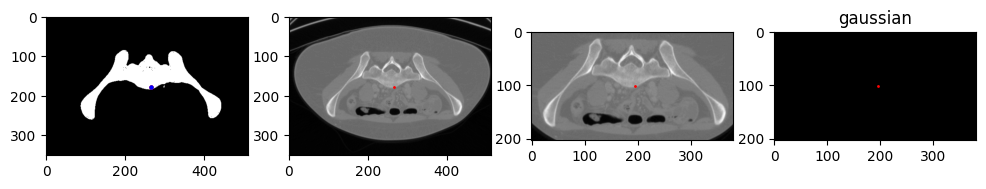

P_10643160_ANTROP.nrrd


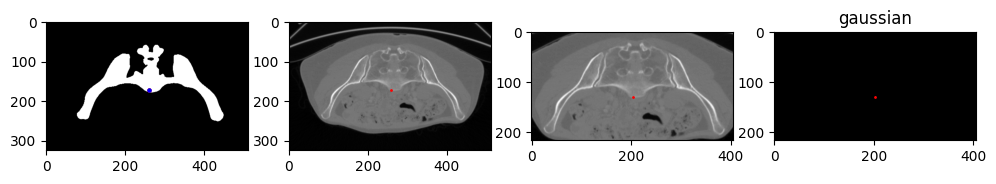

P_80411795_ANDRO.nrrd


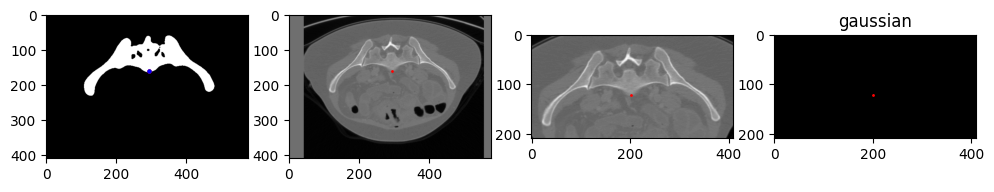

P_840057000_ANTROP.nrrd


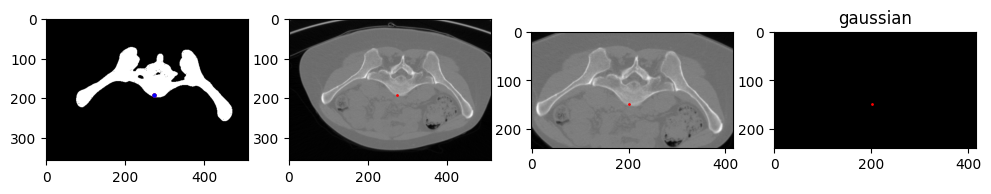

P_1059692_ANTROP.nrrd


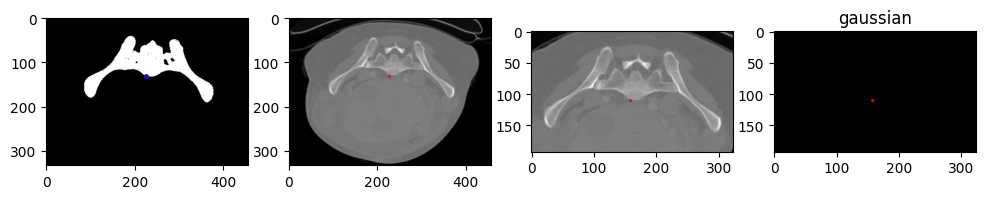

P_10040985_GIN.nrrd


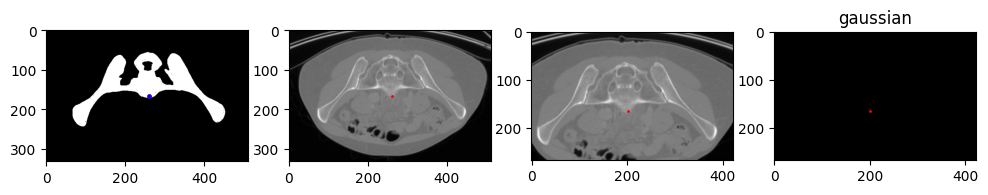

P_2207042_ANTROP.nrrd


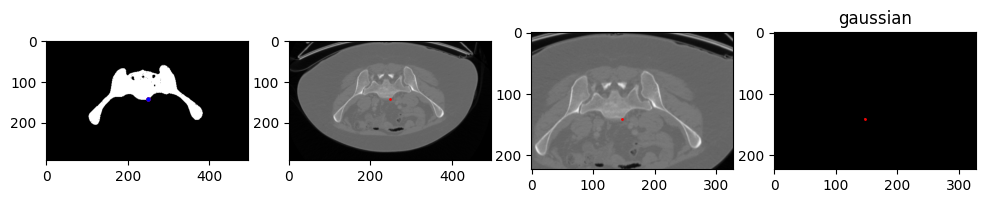

P_808761105_PLATI.nrrd


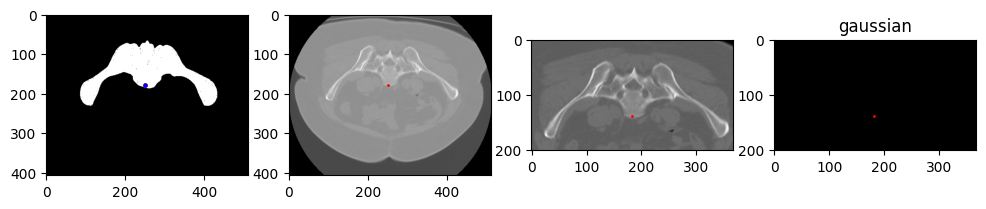

P_2170236-GIN.nrrd


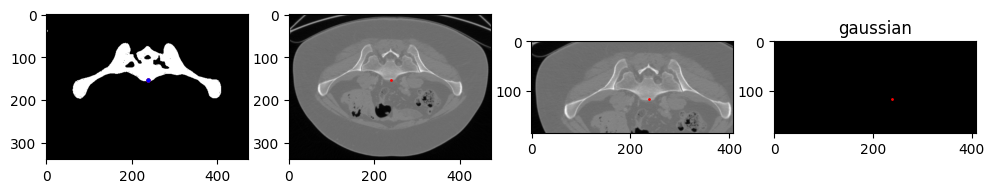

P_10034664_GIN.nrrd


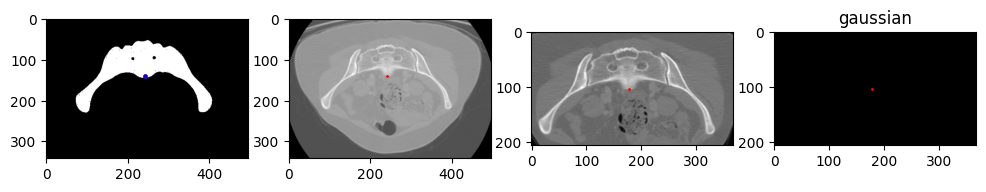

In [2]:
import SimpleITK as sitk
import numpy as np
import matplotlib.pyplot as plt

def crop_nonzero(image):
    # Encuentra las coordenadas de los píxeles no nulos
    nonzero_rows, nonzero_cols, nonzero_planes = np.nonzero(image)

    # Encuentra los límites del cuadro no nulo
    min_row, max_row = np.min(nonzero_rows), np.max(nonzero_rows)
    min_col, max_col = np.min(nonzero_cols), np.max(nonzero_cols)
    min_plane, max_plane = np.min(nonzero_planes), np.max(nonzero_planes)

    # Recorta la imagen según los límites encontrados
    cropped_image = image[min_row:max_row+1, min_col:max_col+1, min_plane:max_plane+1]
    # cropped_gaussian = gaussian[min_row:max_row+1, min_col:max_col+1, min_plane:max_plane+1]
    return cropped_image

def gaussian_3d(shape, center, sigma = 0.4):
    x = np.arange(0, shape[0], 1, float)
    y = np.arange(0, shape[1], 1, float)
    z = np.arange(0, shape[2], 1, float)
    

    x, y, z = np.meshgrid(x, y, z)
    
    gaussian = np.exp(-((x - center[0])**2 + (y - center[1])**2 + (z - center[2])**2) / (2 * sigma**2))

    return gaussian / np.max(gaussian)

def crop_original_image(original_image_path, masked_image_path,landmarks_folder, gaussian_image_path, output_path, save_landmarks_folder,binary_mask_path):
    image_list = os.listdir(original_image_path)
    mask_list = os.listdir(masked_image_path)
    # Cargar las imágenes originales y de máscara
    for i in range(len(image_list)):
        image_file = image_list[i]
        landmarks_filename = f"{os.path.splitext(image_file)[0]}_landmarks.txt"
        landmarks_path = os.path.join(landmarks_folder, landmarks_filename)
        
        if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"):  
            
            original_image = sitk.ReadImage(original_image_path + image_list[i] ,sitk.sitkFloat32) 
            print(image_file)
            landmarks = np.loadtxt(landmarks_path)
            masked_filename = f"{os.path.splitext(image_file)[0]}_mask_image.nrrd"
            
            masked_image = sitk.ReadImage(masked_image_path + masked_filename,sitk.sitkFloat32)
            im_Arr = sitk.GetArrayFromImage(original_image)
            
            if (original_image.GetSize() == masked_image.GetSize()):
                # min_value = im_Arr.min()
                # max_value = im_Arr.max()
                # normalized_array = (im_Arr - min_value) / (im_Arr - min_value)
                # im_Arr = normalized_array
                
                # Obtener los datos de la imagen de máscara
                mask_array = sitk.GetArrayFromImage(masked_image)
                mask_array[mask_array != 0] = 1
                
            # quedarme con el componente mas grande:

                im_arr = mask_array
                class_segmentation = im_arr.astype(np.uint8)

                # Perform connected components labeling on the thresholded segmentation
                labeled, num_features = label(class_segmentation)

                # Filter out small components (adjust the minimum size as needed)

                max_size = 0
                for label_value in range(1, num_features + 1):
                    component_mask = (labeled == label_value).astype(np.float32)
                    component_size = component_mask.sum()
                    
                    if component_size > max_size:
                        max_size = component_size 
                        max_component = component_mask

                class_segmentation = max_component

                mask_array = class_segmentation

                cropped_image_2 = crop_nonzero(mask_array)

                cropped_masked_image = sitk.GetImageFromArray(cropped_image_2)
                # Encontrar las coordenadas del rectángulo que rodea la máscara
                # bounding_box = np.argwhere(cropped_image_2 > 0)
                mask_array = sitk.GetArrayFromImage(masked_image)
                mask_array[mask_array != 0] = 1
                
                # save masked arrays:
                binary_mask = sitk.GetImageFromArray(mask_array)
                
                sitk.WriteImage(binary_mask, binary_mask_path + image_file)
                
            

            # CROP 
                cropped_image_2 = crop_nonzero(mask_array)

                # Encontrar las coordenadas del rectángulo que rodea la máscara
                bounding_box = np.argwhere(mask_array > 0)
                min_coords = bounding_box.min(axis=0)
                max_coords = bounding_box.max(axis=0)

                # Recortar la región de interés de la imagen original
                cropped_array = im_Arr[min_coords[0]:max_coords[0] + 1,
                                            min_coords[1]:max_coords[1] + 1,
                                            min_coords[2]:max_coords[2] + 1]
                
                # Crear una nueva imagen recortada
                cropped_image = sitk.GetImageFromArray(cropped_array)
                cropped_image.SetSpacing(original_image.GetSpacing())
                cropped_image.SetOrigin(original_image.GetOrigin())
                
                origin = np.array(original_image.GetOrigin())
                spacing = np.array(original_image.GetSpacing())    
                
                direction_matrix = np.array(original_image.GetDirection()).reshape((3,3))

                coordinates = []
                padded_coordinates = []
                surface_points = []
                
                # Crear una imagen para mostrar las gaussianas
                gaussian_image = np.zeros(cropped_image.GetSize())
                gaussian_image_modified = np.zeros(cropped_image.GetSize())

                for landmark in landmarks:
                    # print(landmark)
                    coordinate = np.round(np.linalg.inv(direction_matrix).dot(landmark - origin) / spacing).astype(int)
                    coordinate = abs(coordinate) 
                    coordinates.append(coordinate.tolist())
                    
                    
                    # gaussian_image += gaussian
                # CLOSEST SURFACE POINT
                    # Verificar si el punto original ya está en la máscara
                    # nearest_points = []
                    if mask_array[coordinate[2], coordinate[1], coordinate[0]] != 0:
                        # Si el punto ya está en la máscara, no es necesario buscar el punto más cercano
                        nearest_points = coordinate
                        first_nearest_point = nearest_points
                    else:
                        mask_coordinates = np.transpose(np.nonzero(mask_array))
                        # Construir el árbol KD para búsqueda eficiente
                        kdtree = cKDTree(mask_coordinates)
                        coordinate_modified = np.array(coordinate)
                        _, indices = kdtree.query(coordinate_modified)
                        # Calcular las distancias entre todos los puntos de la máscara y los puntos dados
                        # distances = cdist(coordinate_modified, mask_coordinates)

                        # # Encontrar los índices de las distancias mínimas para cada punto
                        # indices = np.argmin(distances, axis=1)
                        nearest_points = mask_coordinates[indices]
                        
                    surface_points.append(nearest_points)
                    
                    if not np.array_equal(coordinate, nearest_points):
                        
                        
                        landmarks_after_padding = nearest_points - np.array([min_coords[2], min_coords[1], min_coords[0]])
                        
                        gaussian_modified = gaussian_3d(cropped_image.GetSize(), landmarks_after_padding.tolist())
                        gaussian_modified = np.transpose(gaussian_modified, (1,0,2))
                        
                        gaussian_image += gaussian_modified
                        
                        
                    else:
                        landmarks_after_padding = coordinate - np.array([min_coords[2], min_coords[1], min_coords[0]])
                
                        gaussian = gaussian_3d(cropped_image.GetSize(), landmarks_after_padding.tolist())
                        gaussian = np.transpose(gaussian, (1,0,2))
                        
                        gaussian_image += gaussian
                        
                        
                    padded_coordinates.append(landmarks_after_padding.tolist())
                    
                    gaussian = gaussian_3d(cropped_image.GetSize(), landmarks_after_padding.tolist())
                    gaussian = np.transpose(gaussian, (1,0,2))
            # SAVE GAUSSIANS AND LANDMARKS
                gaussian_image = np.transpose(gaussian_image, (2,1,0))
                
                sitk.WriteImage(sitk.GetImageFromArray(gaussian_image), gaussian_image_path +image_file )
                np.savetxt(save_landmarks_folder + landmarks_filename, padded_coordinates)
            
            # PLOT FUNCTION  
                plt.figure(figsize=(12, 6))
                        
                plt.subplot(1, 4, 1)
                plt.scatter(coordinate[0], coordinate[1], s=5, c='red', marker='o')
                plt.scatter(first_nearest_point[0], first_nearest_point[1], s=5, c='blue', marker='o')
                plt.imshow( (mask_array[coordinate[2],:,:]),cmap="gray")
                
                plt.subplot(1, 4, 2)
                plt.scatter(coordinate[0], coordinate[1], s=1, c='red', marker='o')
                plt.imshow( (im_Arr[coordinate[2],:,:]),cmap="gray")
                
                plt.subplot(1, 4, 3)
                plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=1, c='red', marker='o')
                plt.imshow(sitk.GetArrayFromImage(cropped_image)[int(coordinate[2]), :,:], cmap='gray')
                
                plt.subplot(1, 4, 4)
                plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=1, c='red', marker='o')
                
                plt.imshow(gaussian_image[int(coordinate[2]), :,:], cmap='gray')
                plt.title('gaussian')
                plt.show()
                
                # cropped_image = sitk.GetImageFromArray(cropped_array)
                
                sitk.WriteImage(cropped_image, output_path + image_list[i])
                
            
    
    # Guardar la imagen recortada en formato NRRD
    

# Ejemplo de uso
data_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/"
original_image_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/"
masked_image_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/MASKED_IMAGES/"
gaussian_image_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/LANDMARKS/"
output_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
save_landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
binary_mask_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/BINARY_MASKS/"

crop_original_image(original_image_path, masked_image_path, landmarks_folder, gaussian_image_path, output_path, save_landmarks_folder,binary_mask_path )


# padding and resize

P_1765645_GIN.nrrd


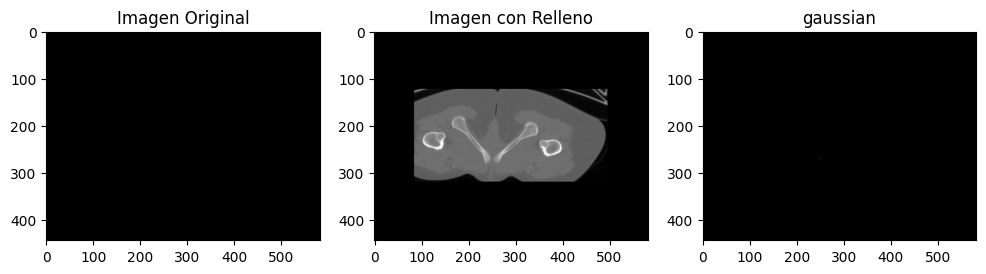

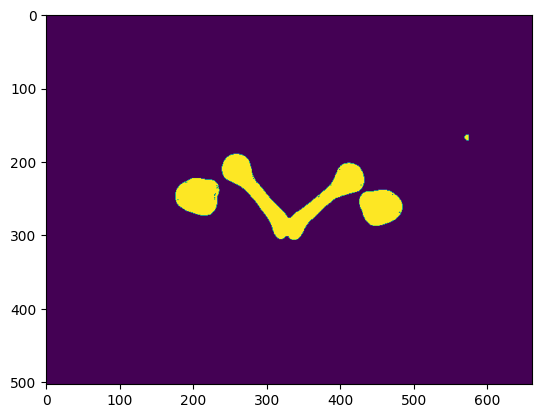

P_1572096_ANTROP.nrrd


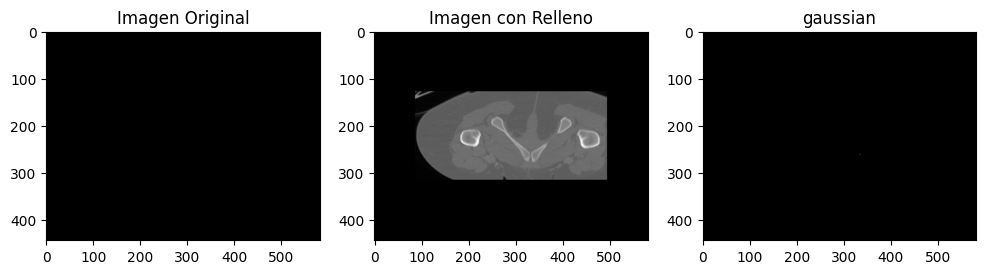

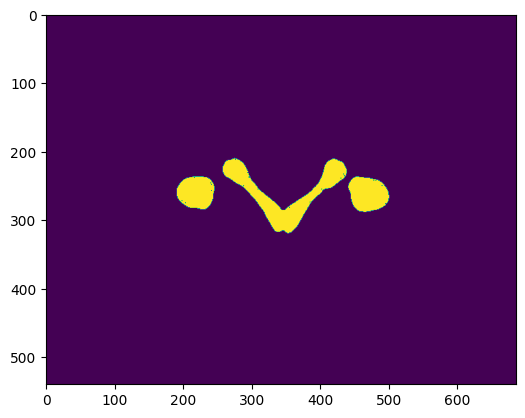

P_10535603_GIN.nrrd


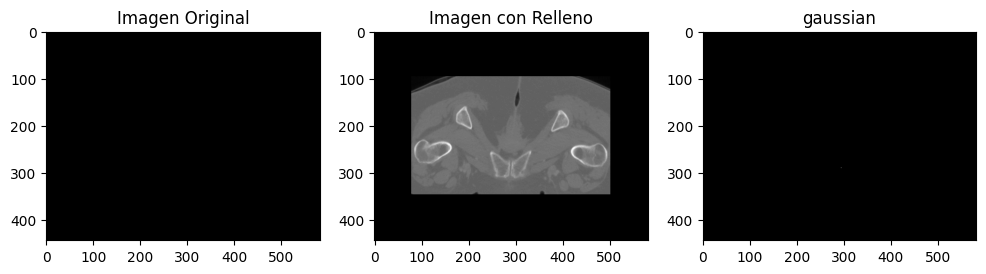

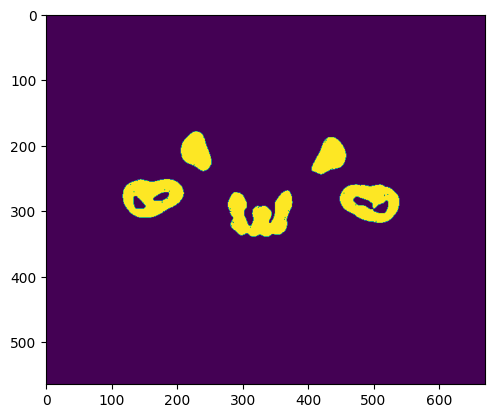

P_808211848_GIN.nrrd


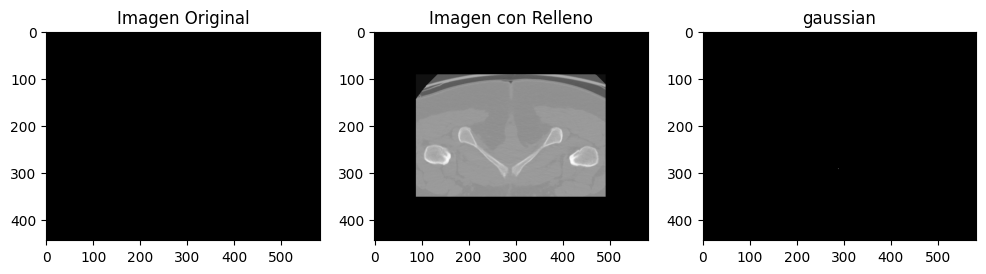

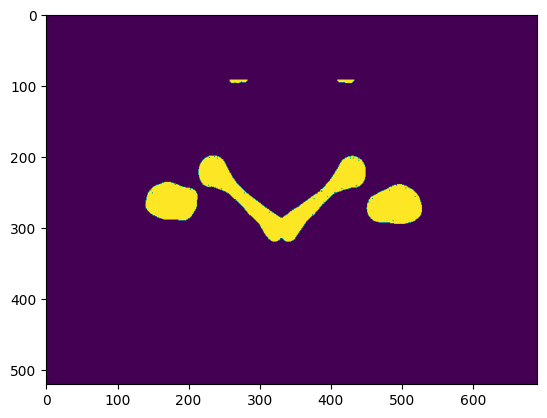

P_10061362_GIN.nrrd


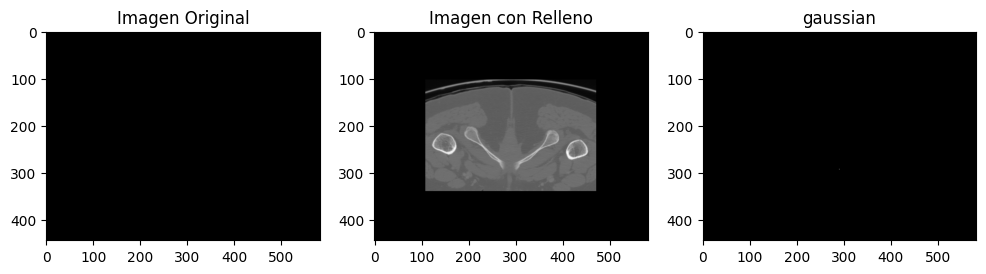

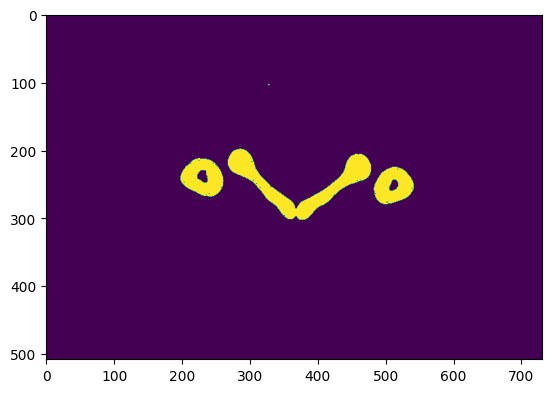

P_10279644_ANTROP.nrrd


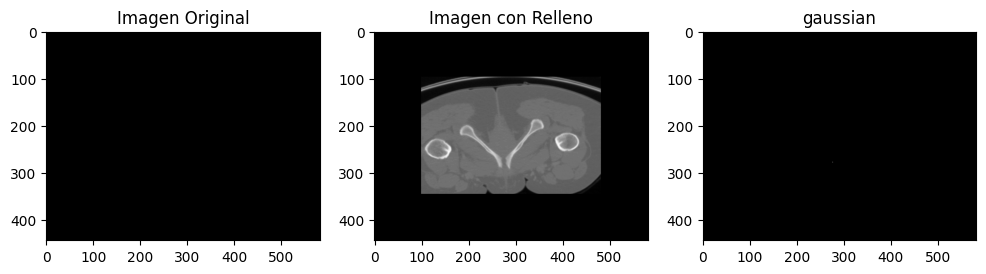

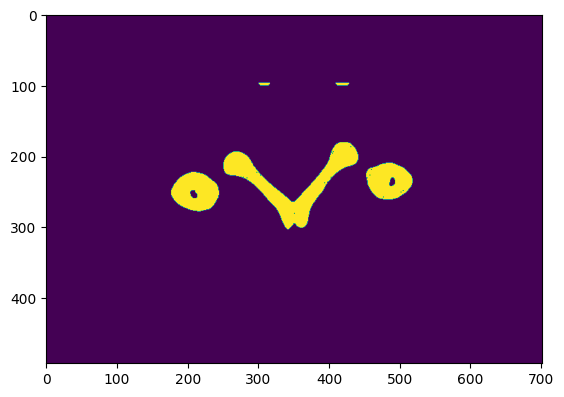

P_2066635_ANTRO.nrrd


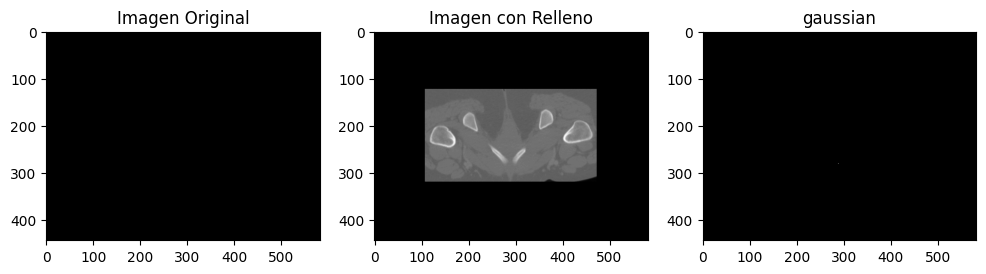

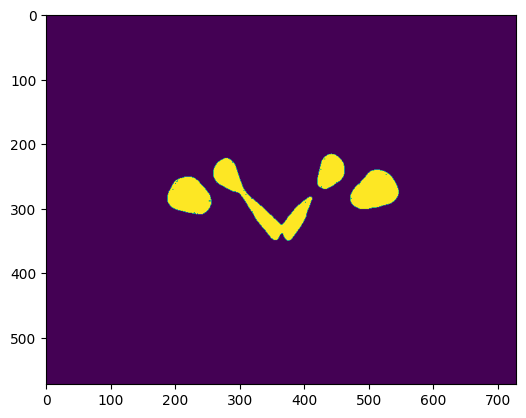

P_2197057_ANTROP.nrrd


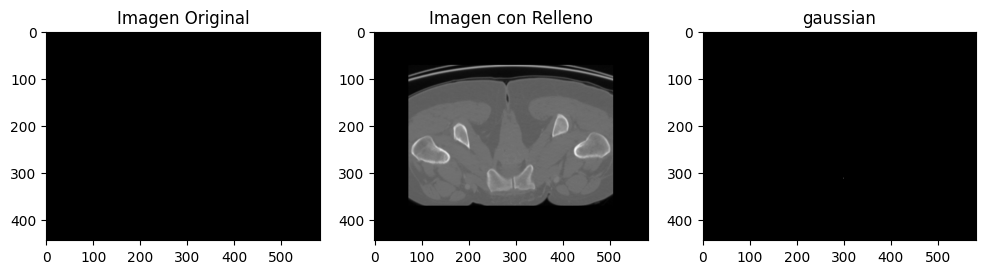

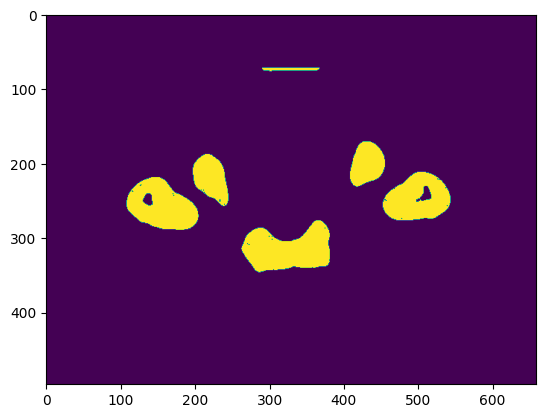

P_2043819_ANDRO.nrrd


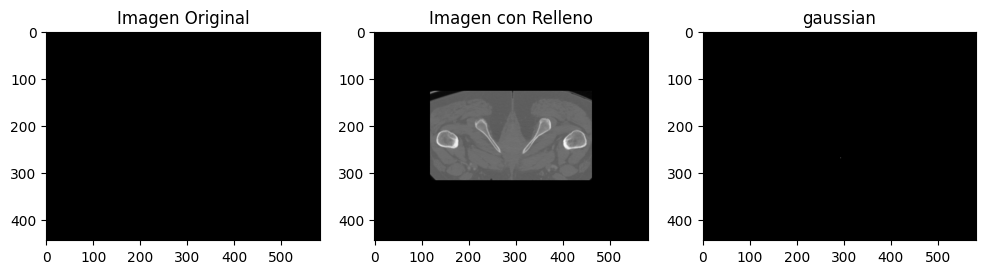

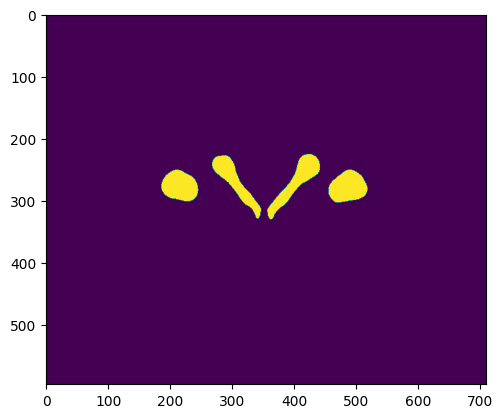

P_1195472_ANTROP.nrrd


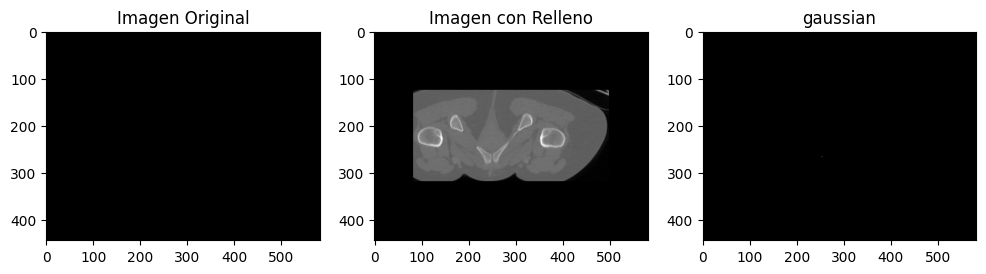

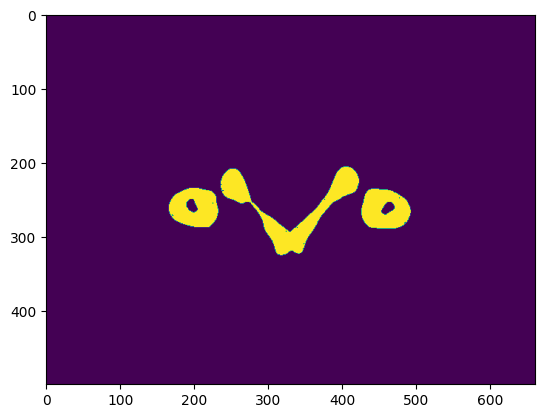

P_1165093_ANTROP.nrrd


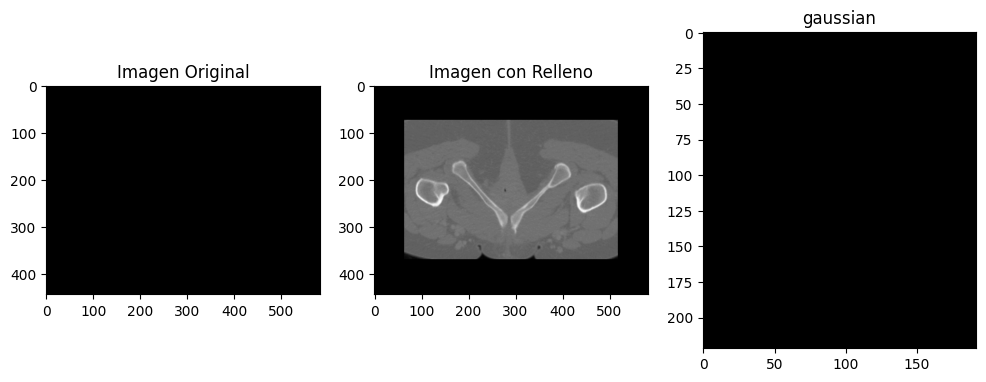

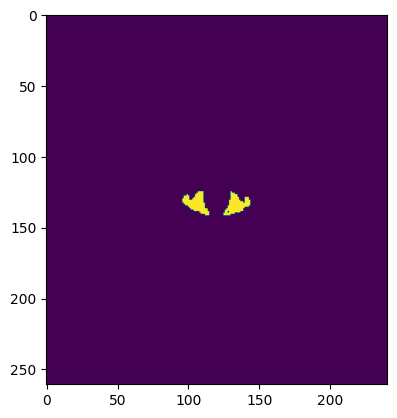

P_10182352_GIN.nrrd


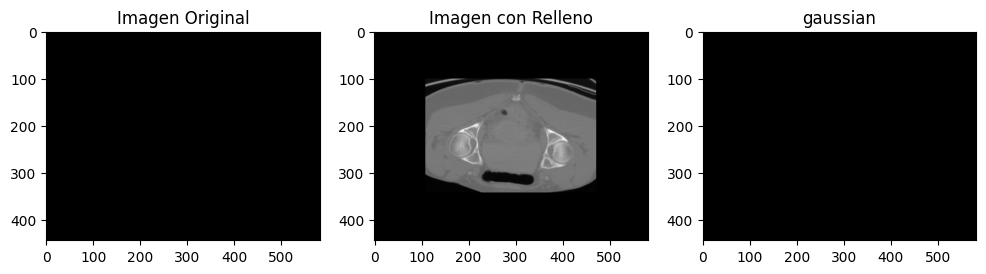

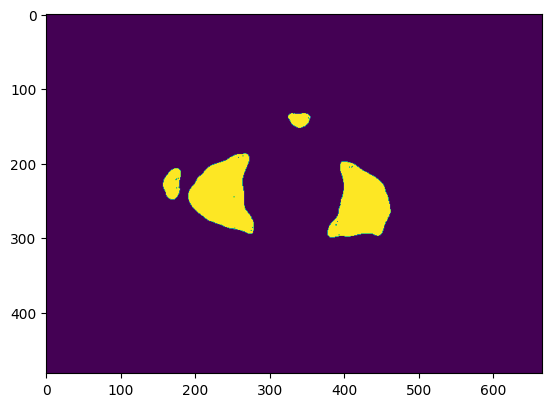

P_2241943_ANTROP.nrrd


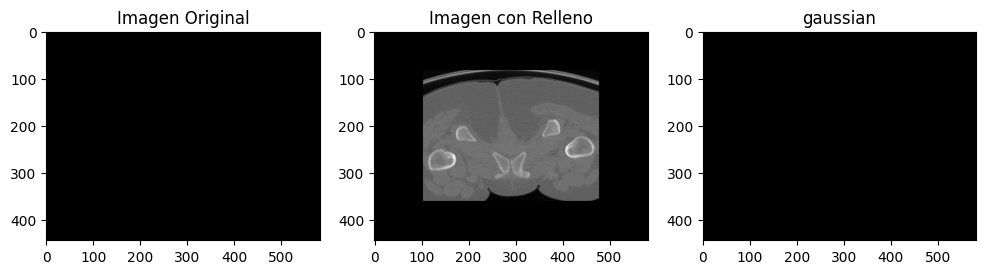

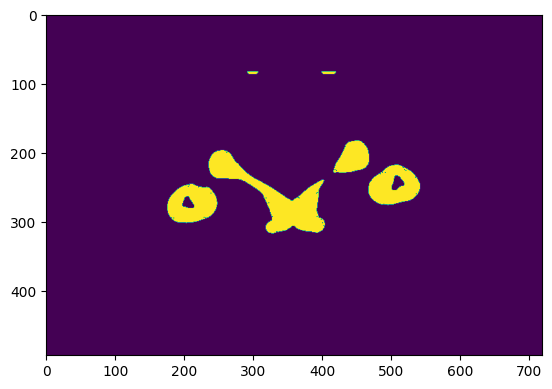

P_840104562_ANTROP.nrrd


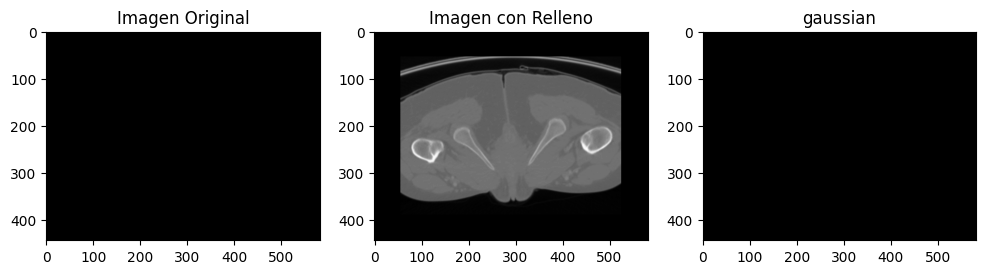

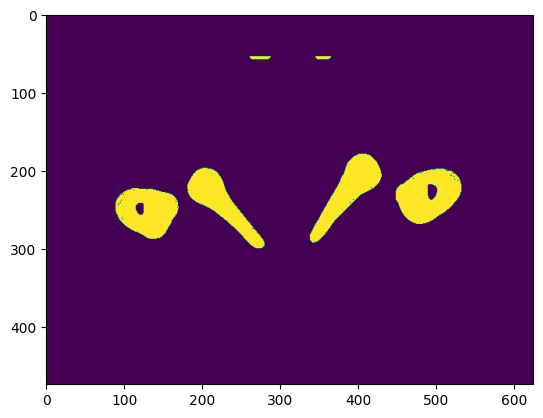

P_2418993_GIN.nrrd


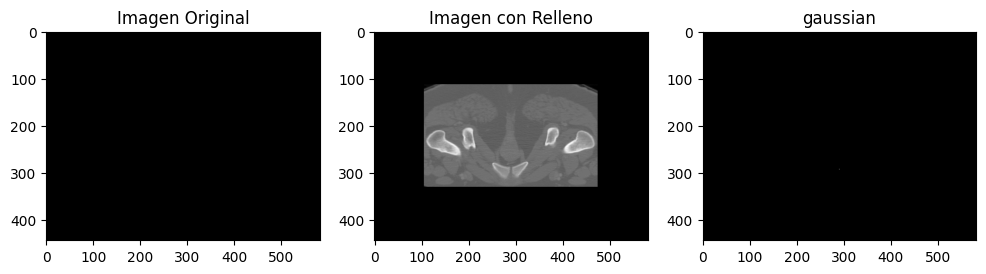

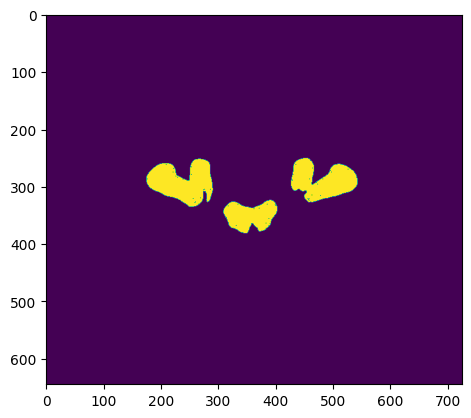

P_840114360_ANTROP.nrrd


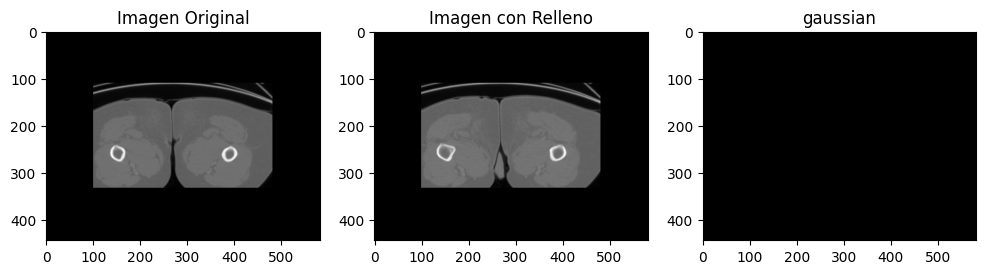

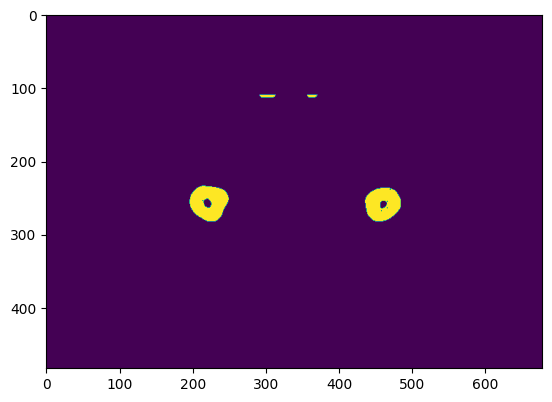

P_802351174_ANTROP.nrrd


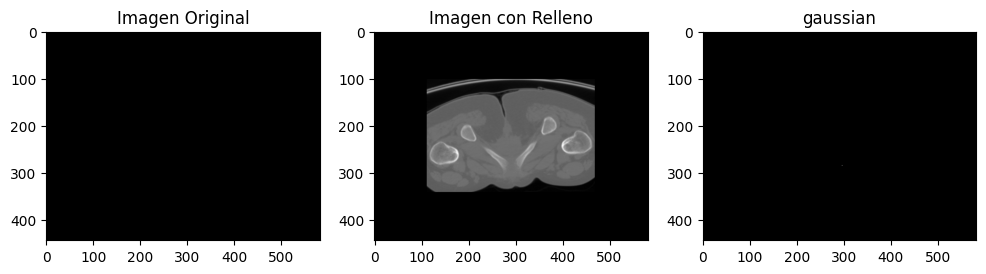

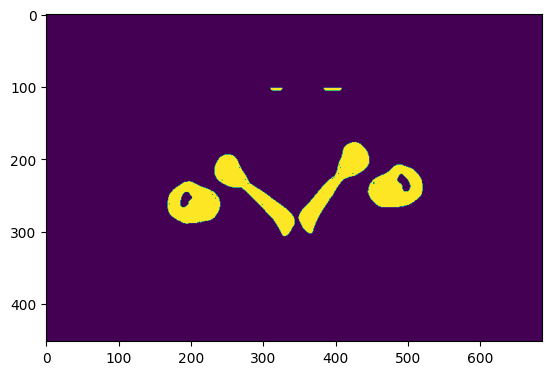

P_2379678_ANTROP.nrrd


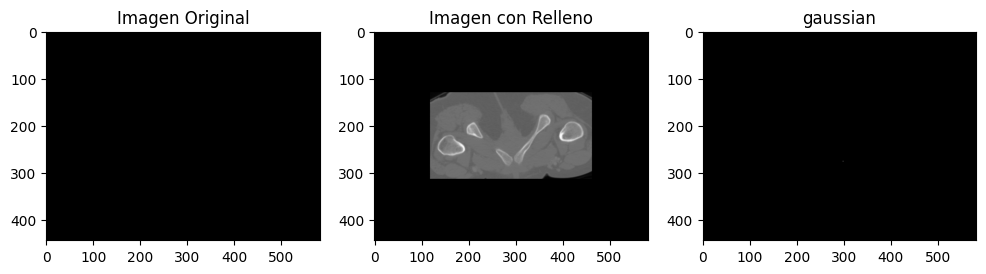

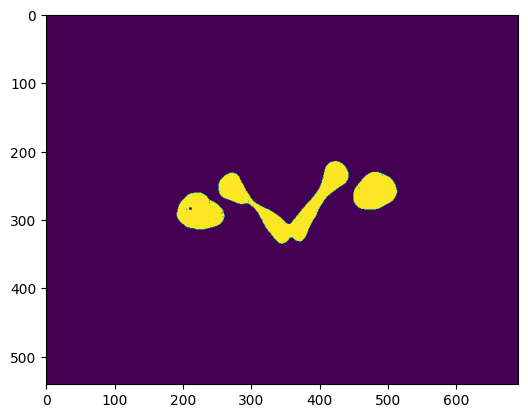

P_10253637_ANTROP.nrrd


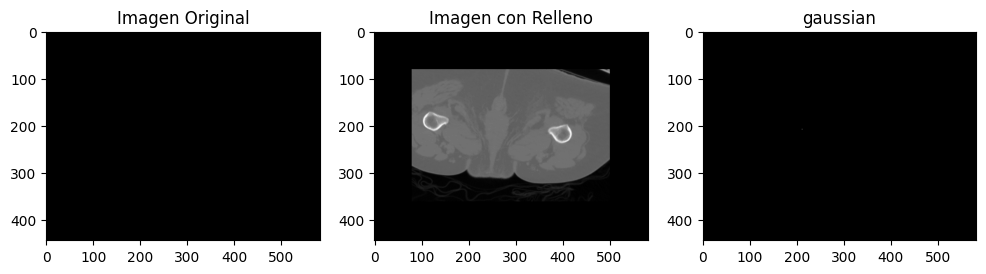

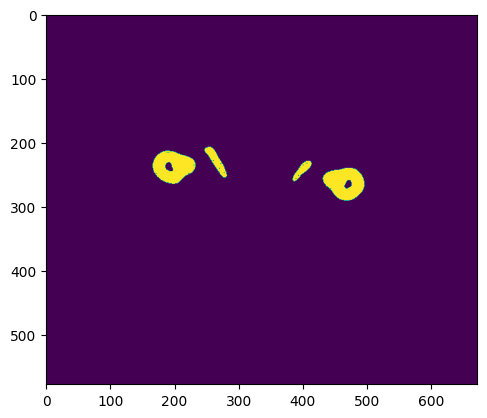

P_10265450_ANTROP.nrrd


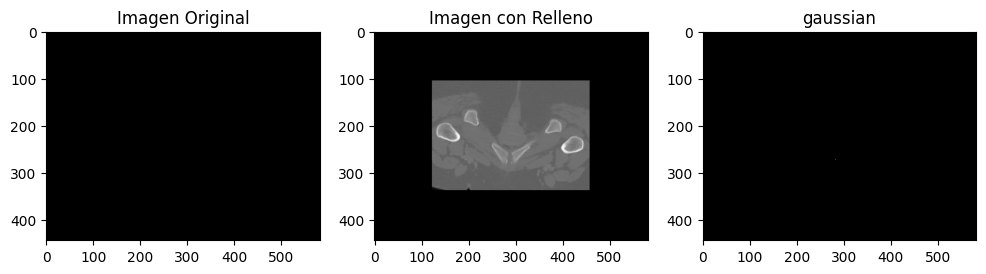

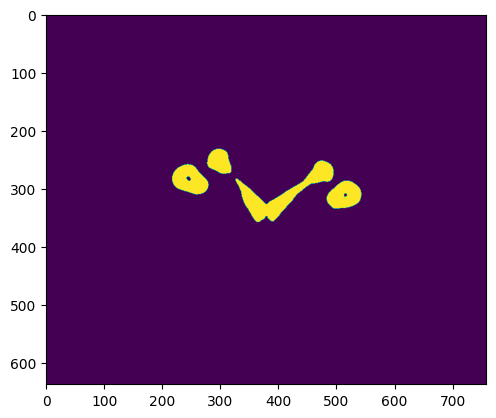

P_1480679_ANTROP.nrrd


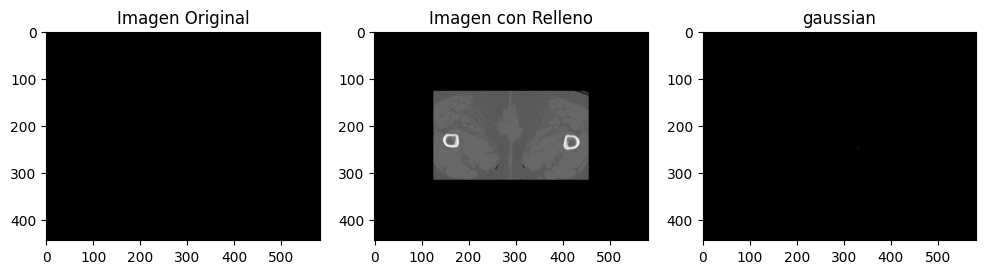

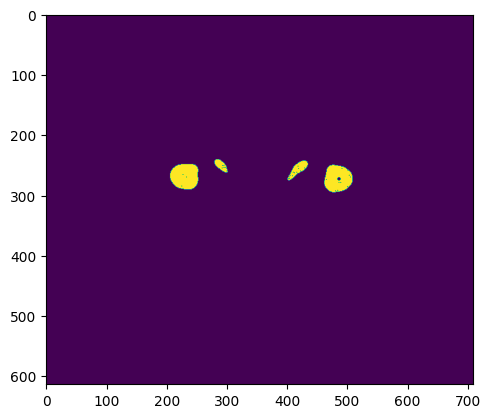

P_2387418_GIN.nrrd


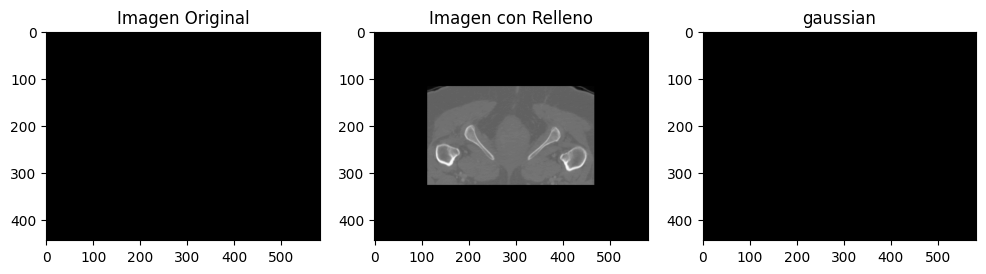

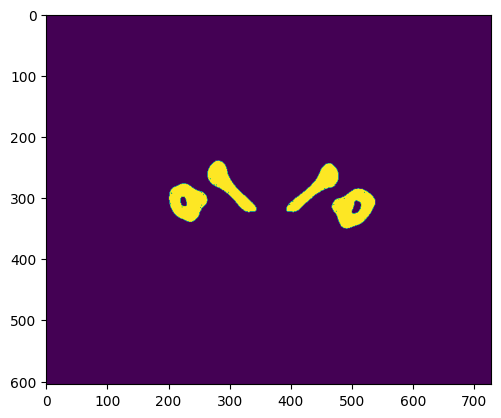

P_10208792_ANDRO.nrrd


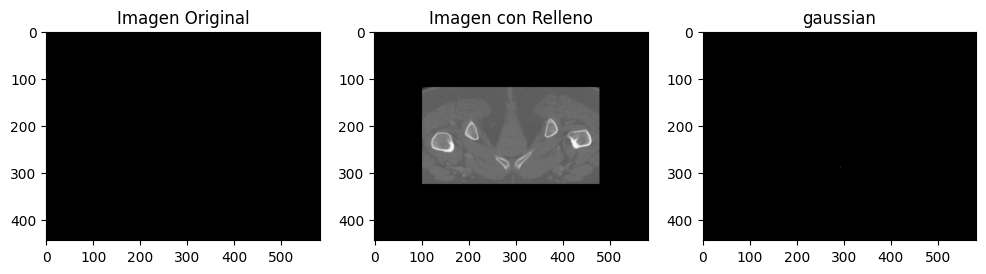

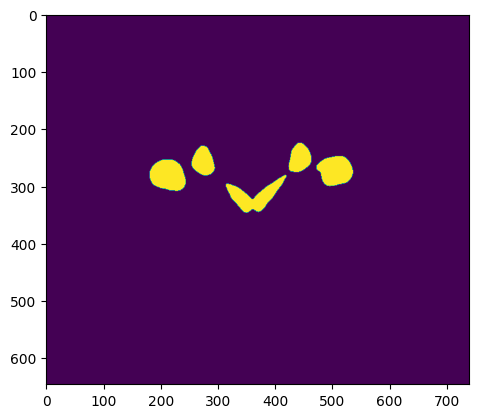

P_10190176_ANTROP.nrrd


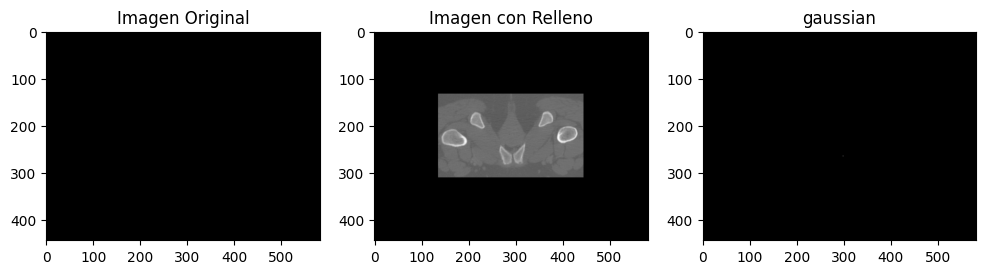

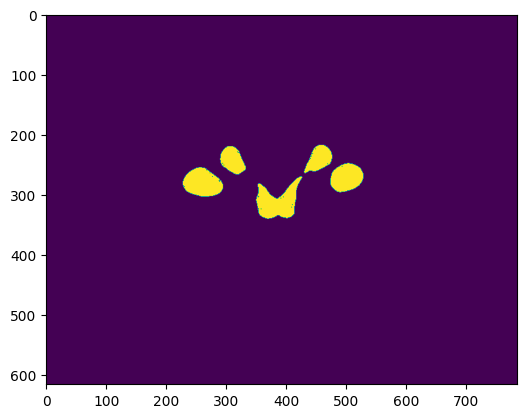

P_2111864_ANTROP.nrrd


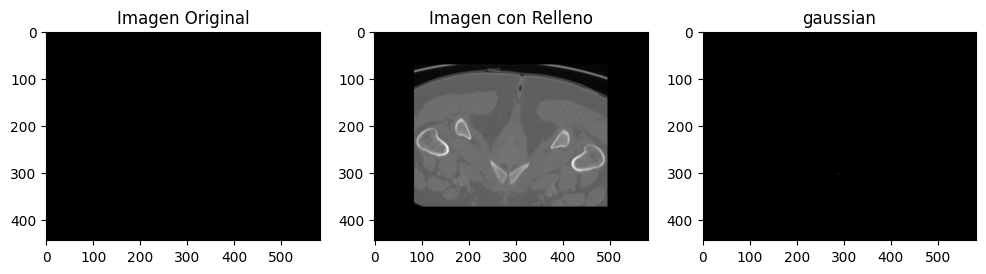

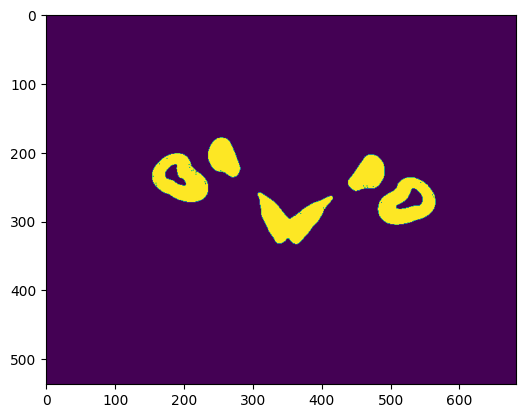

P_1571575_GIN.nrrd


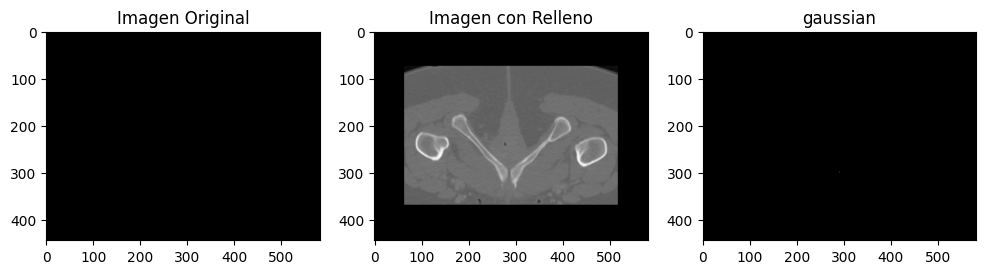

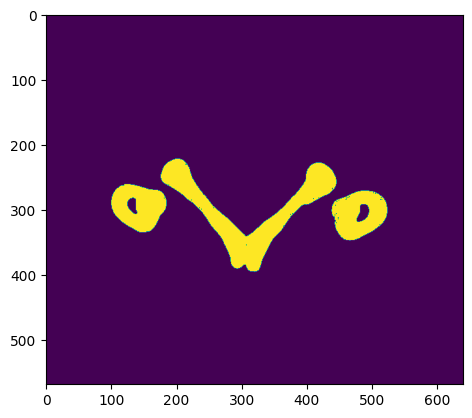

P_10055401_GIN.nrrd


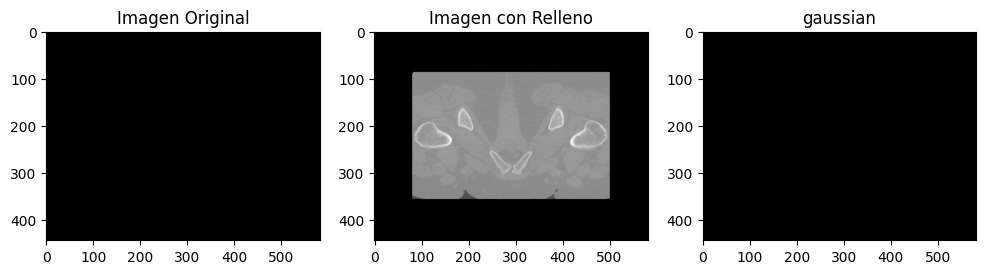

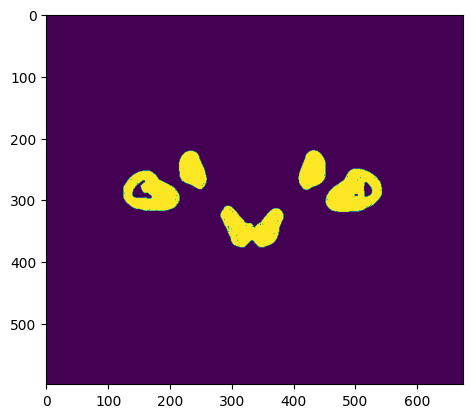

P_1715822_ANTROP.nrrd


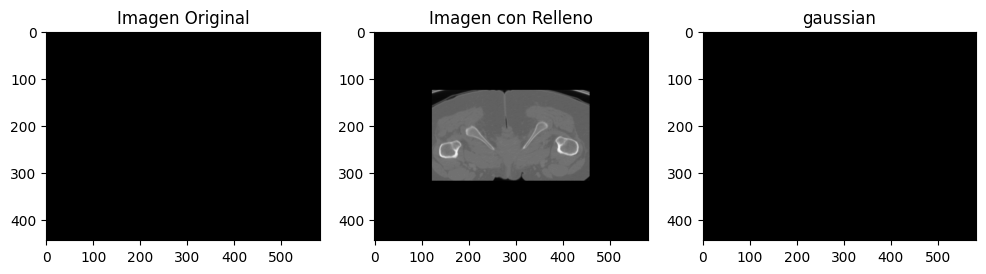

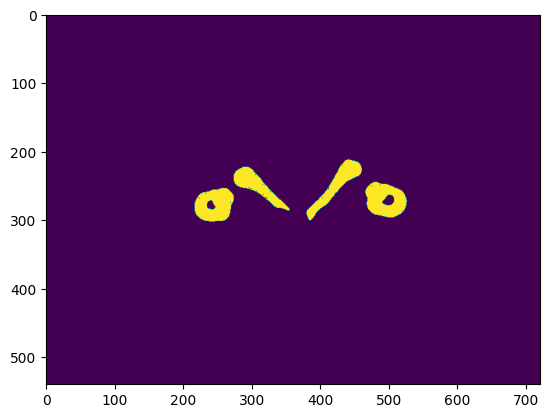

P_840121405_GIN.nrrd


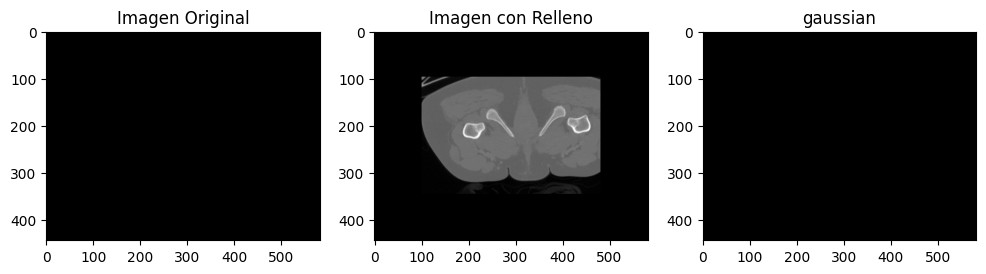

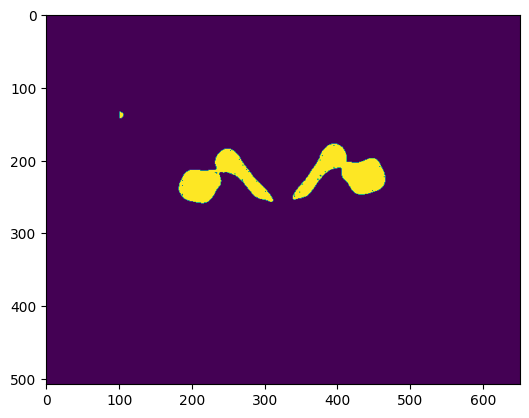

P_1683063_ANTROP.nrrd


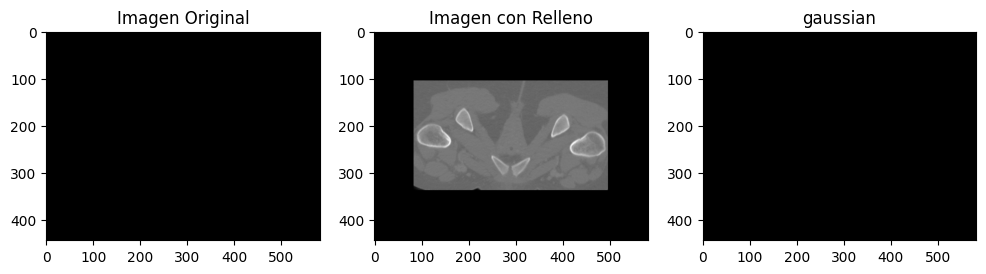

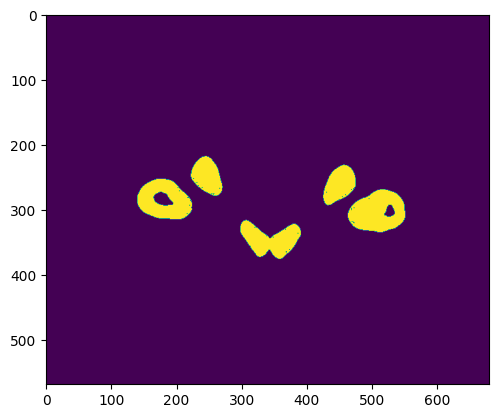

P_1683587_ANTROP.nrrd


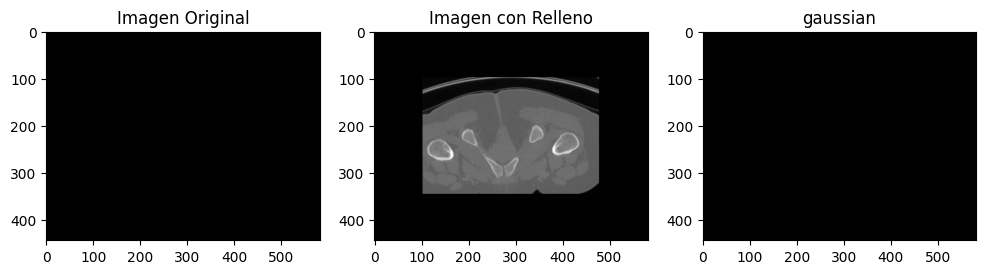

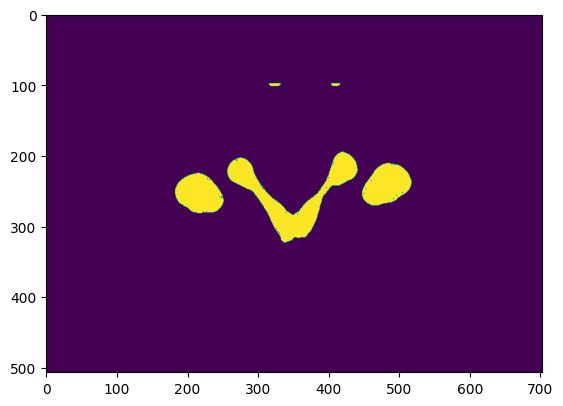

P_2370576_GIN.nrrd


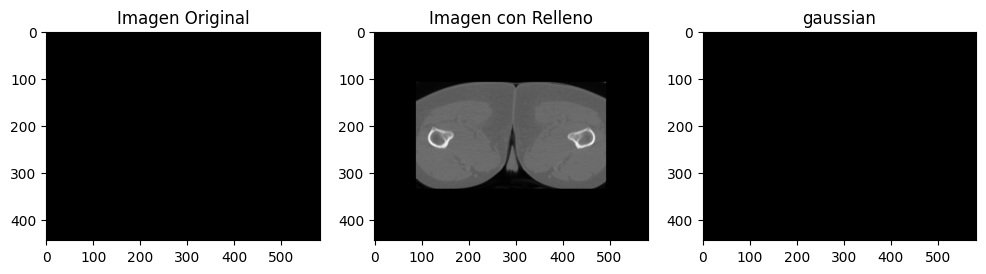

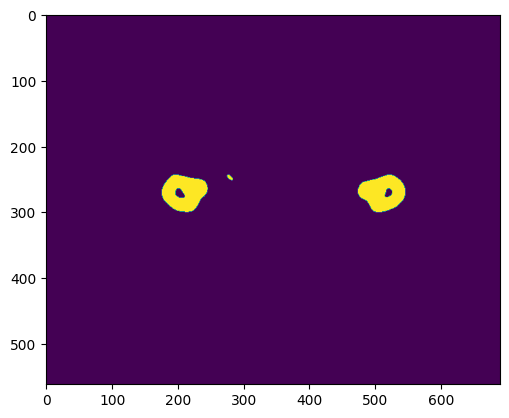

P_840248498_ANTROP.nrrd


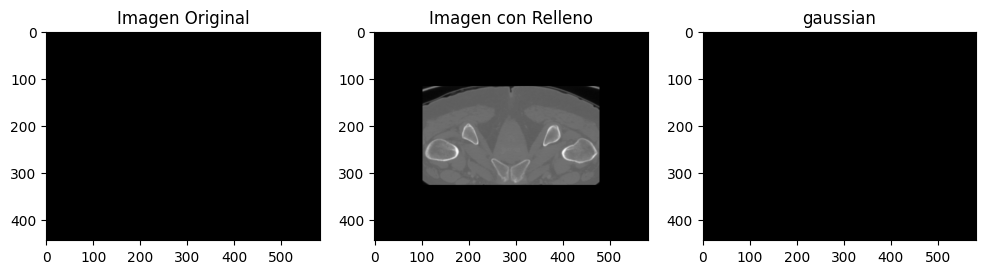

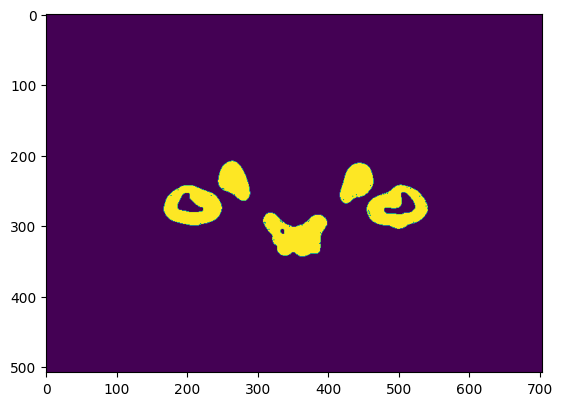

P_10390193_GIN.nrrd


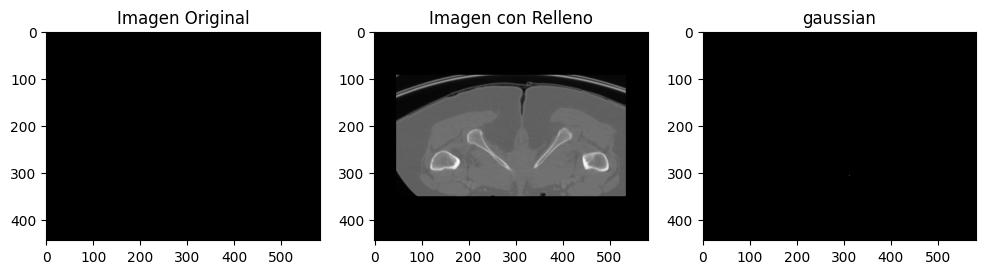

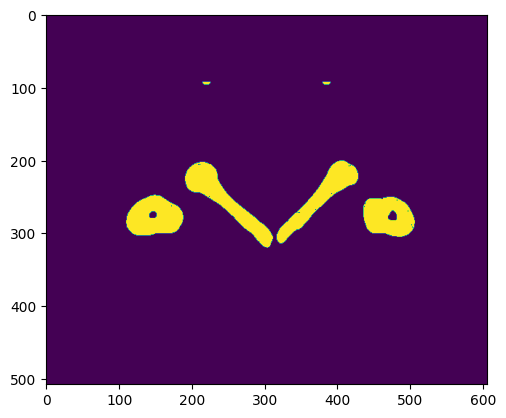

P_1905095_GIN.nrrd


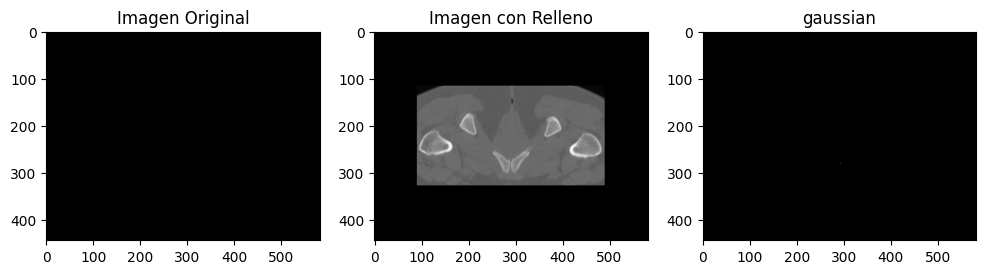

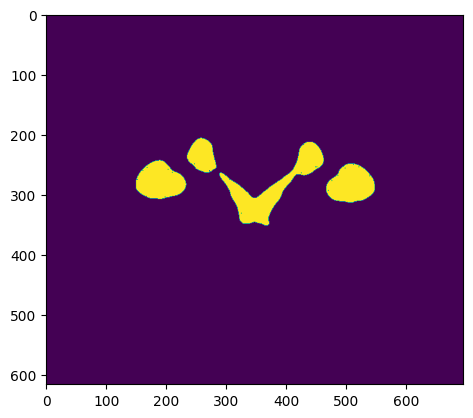

P_2002362_ANTROP.nrrd


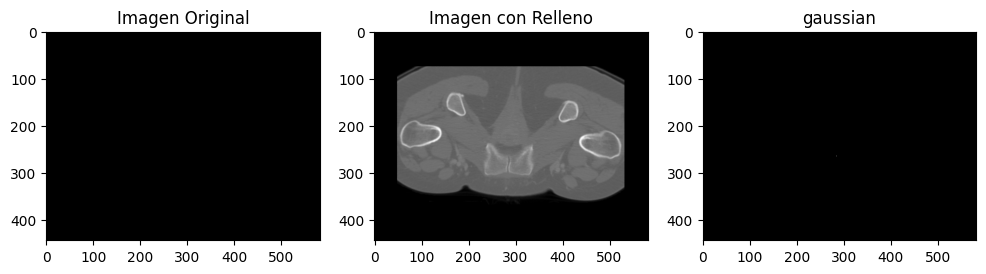

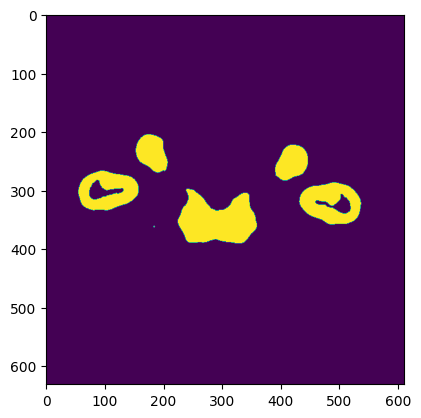

P_1132495_ANTROP.nrrd


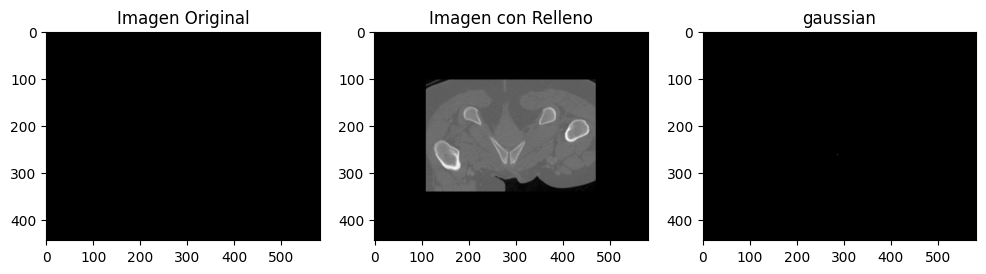

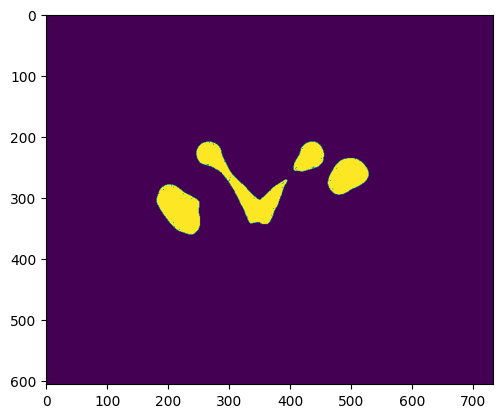

P_1444487_ANTROP.nrrd


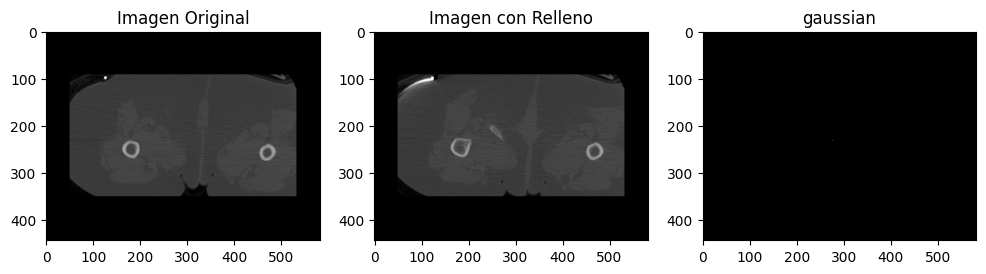

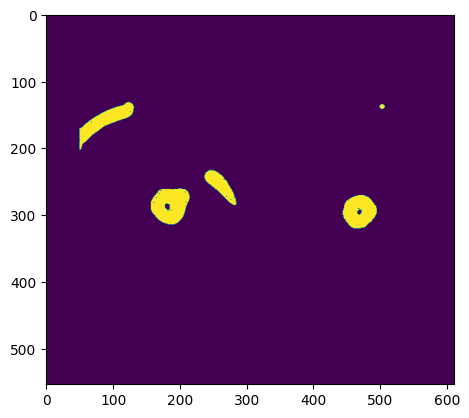

P_1716840_ANTROP.nrrd


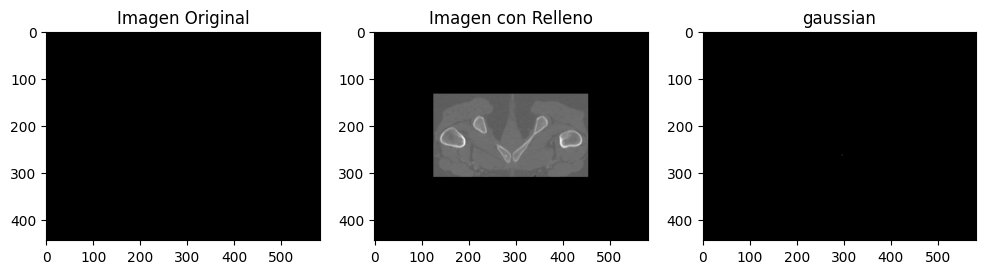

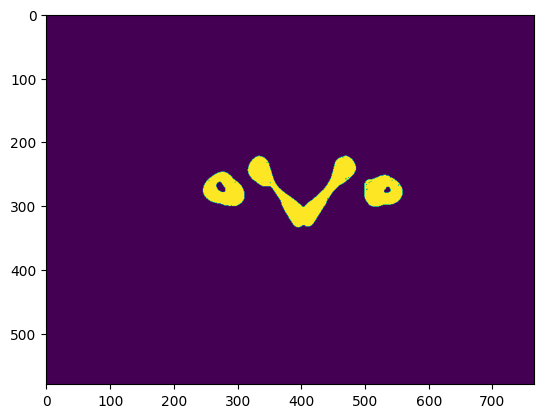

P_1825137_PLATI.nrrd


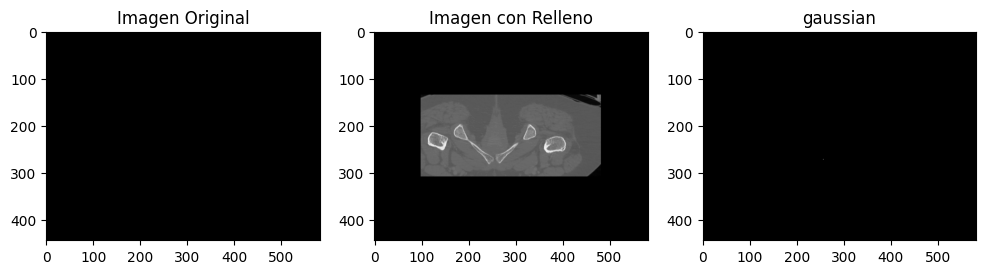

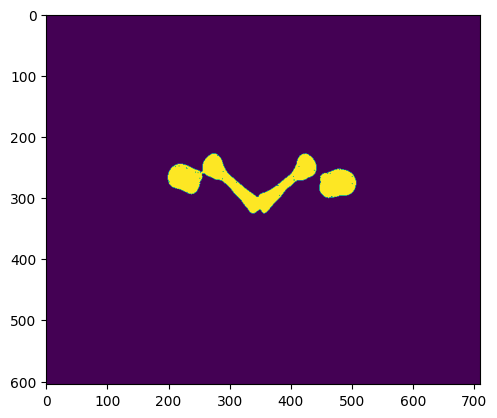

P_2369281_ANTROP.nrrd


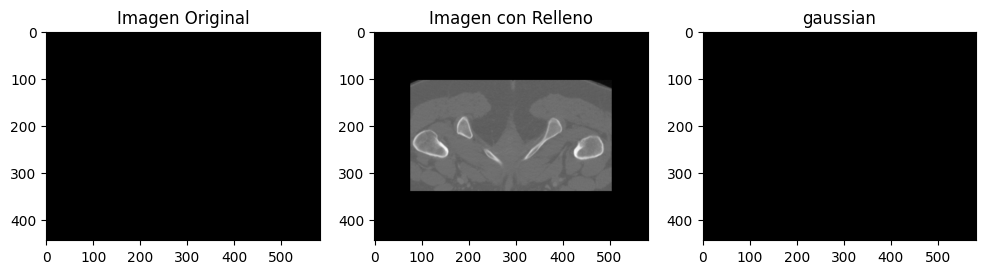

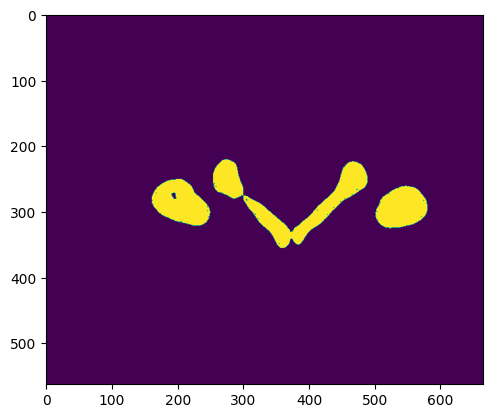

P_2319187_GIN.nrrd


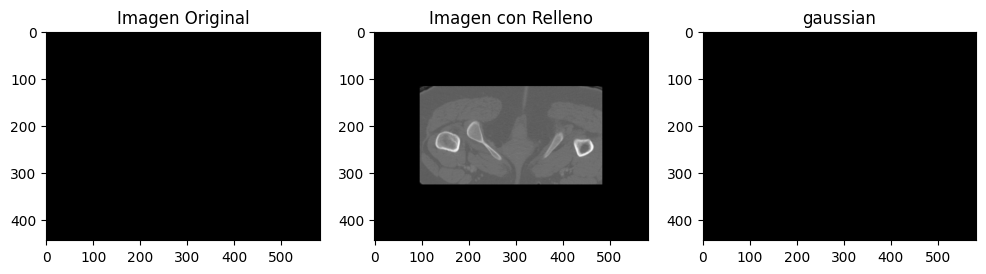

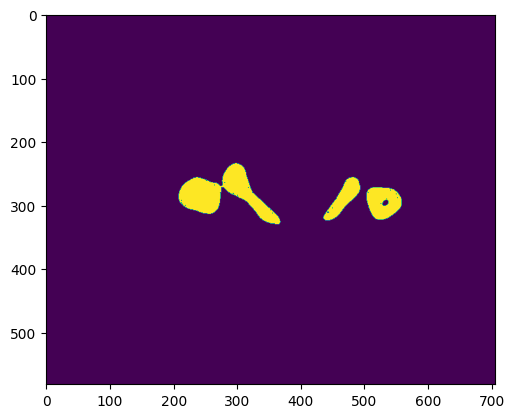

P_1993084_ANTROP.nrrd


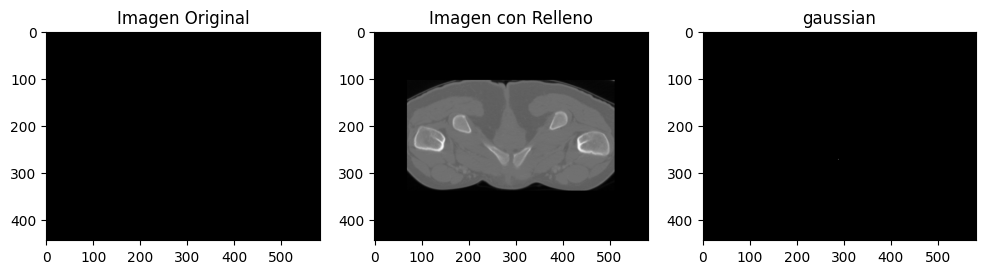

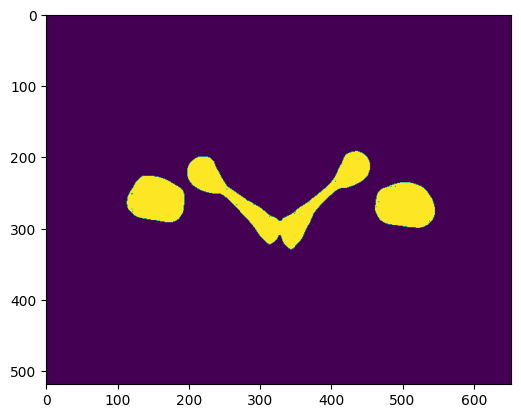

P_1612231_GIN.nrrd


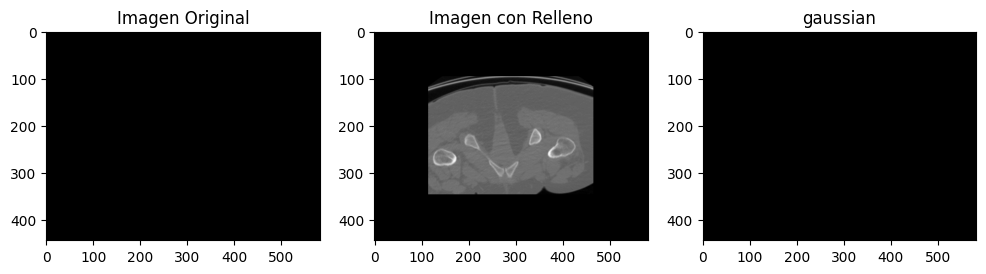

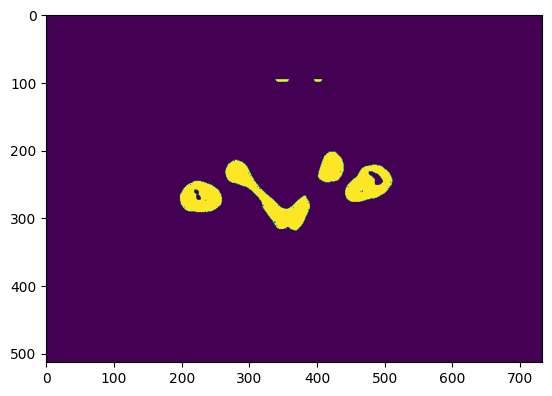

P_2146763_GIN.nrrd


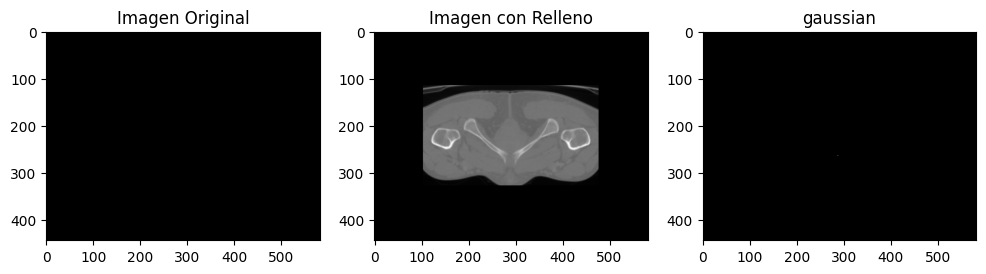

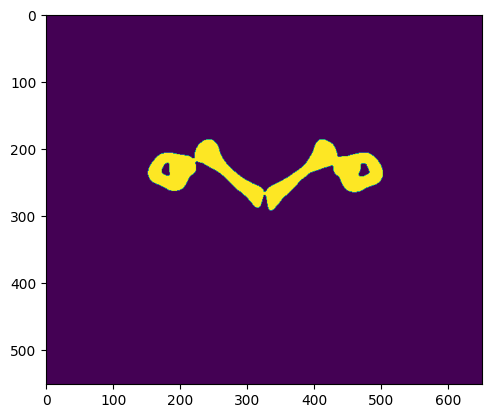

P_2039080_GIN.nrrd


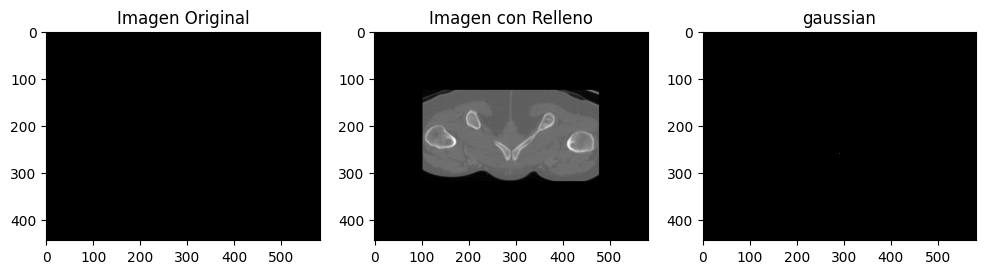

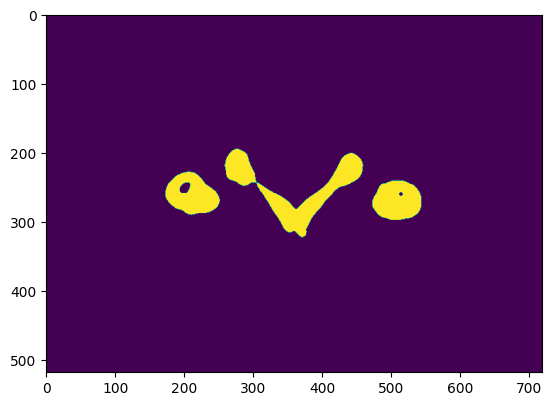

P_10550586_ANTROP.nrrd


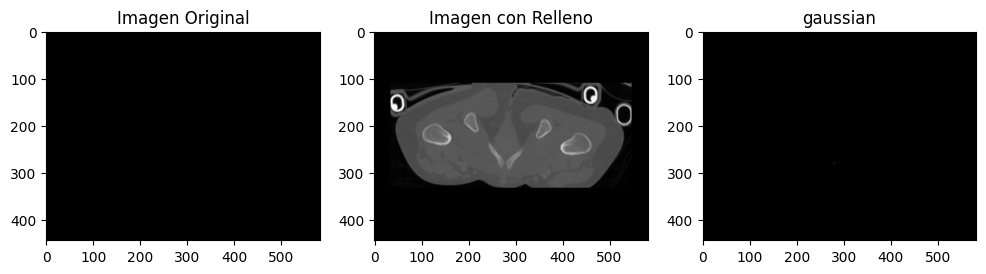

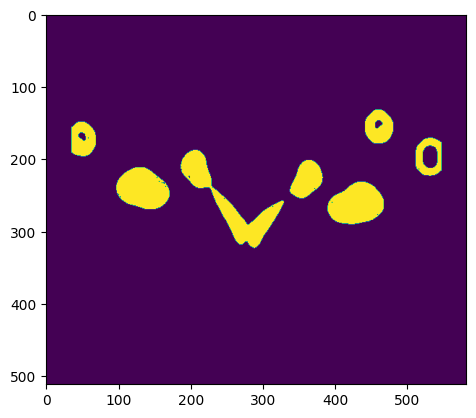

P_1427769_GIN.nrrd


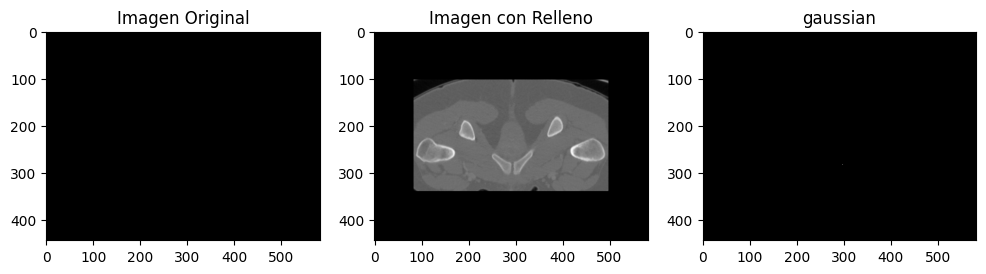

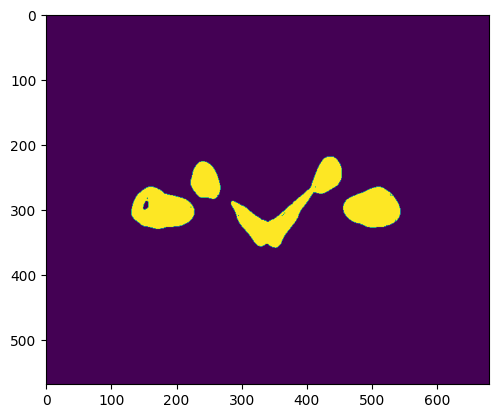

P_10292632_ANTROP.nrrd


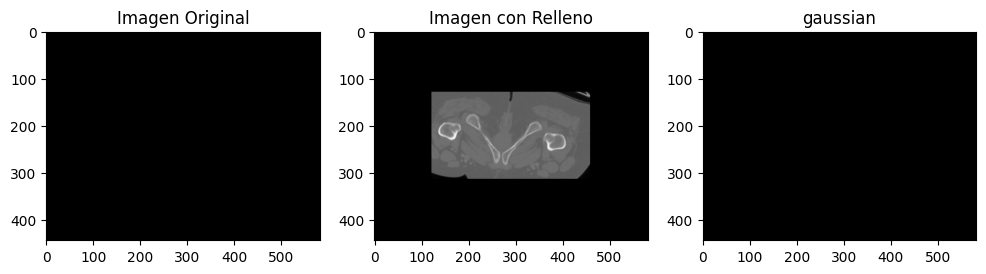

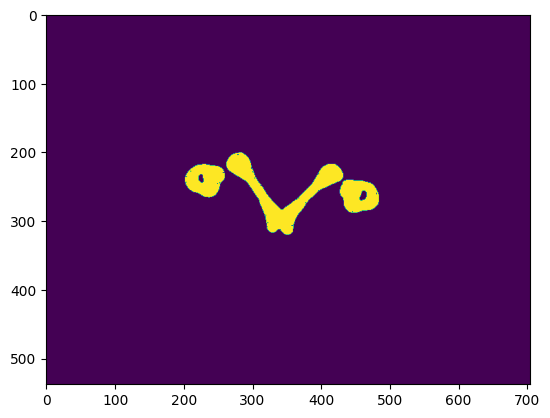

P_2156592_ANTROP.nrrd


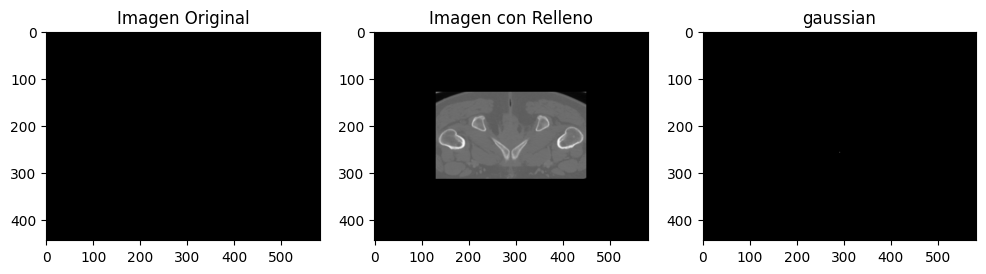

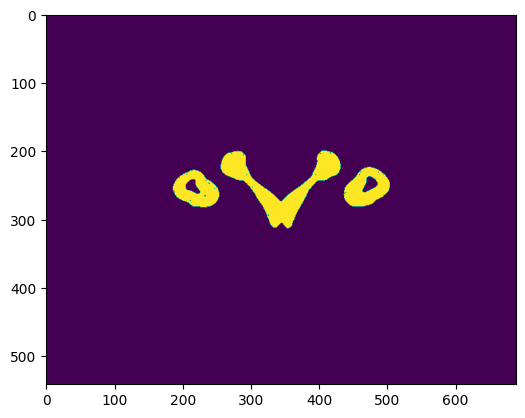

P_10860322_GIN.nrrd


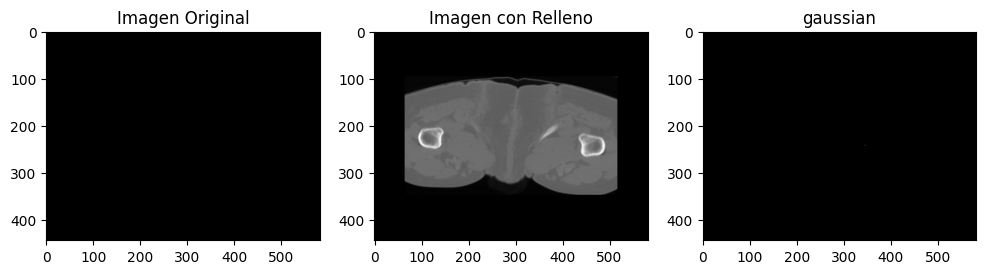

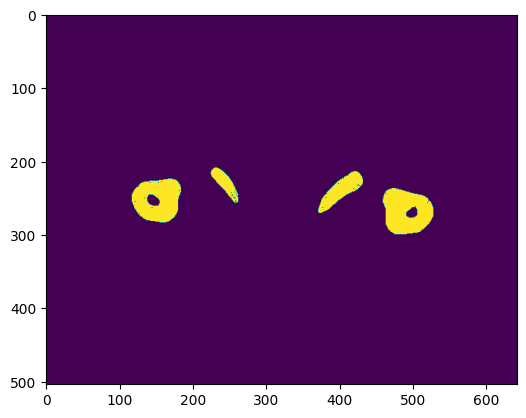

P_2196069_ANTROP.nrrd


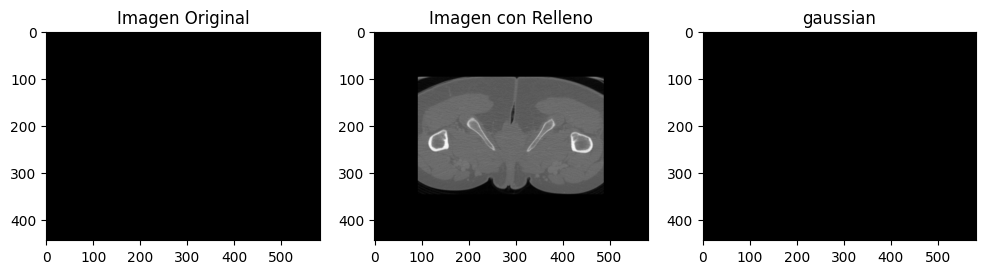

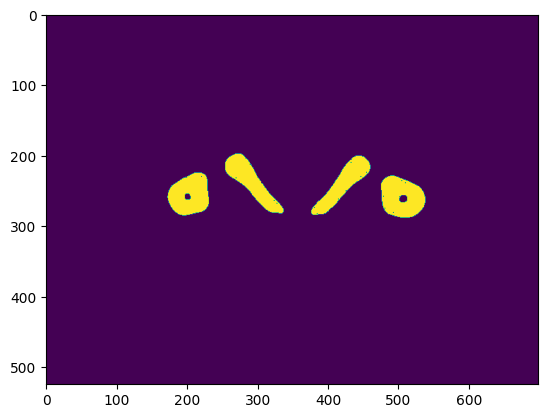

P_1874278_GIN.nrrd


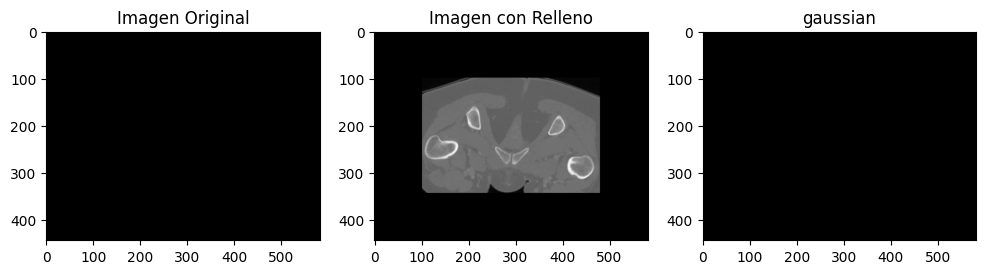

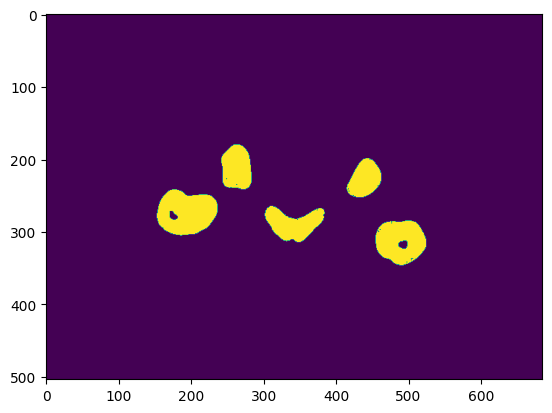

P_840109842_GIN.nrrd


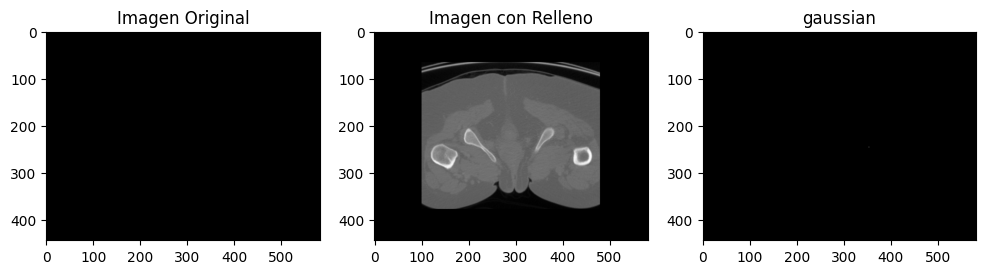

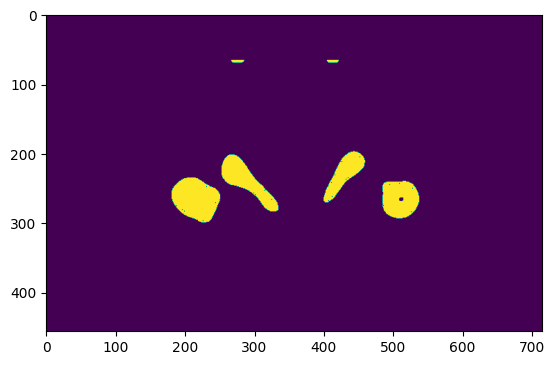

P_808704728_ANTROP.nrrd


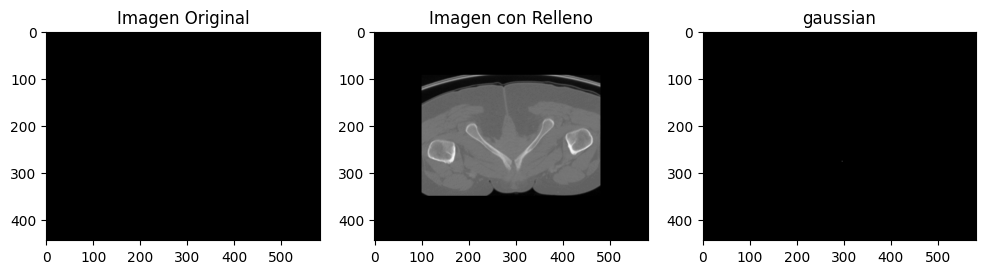

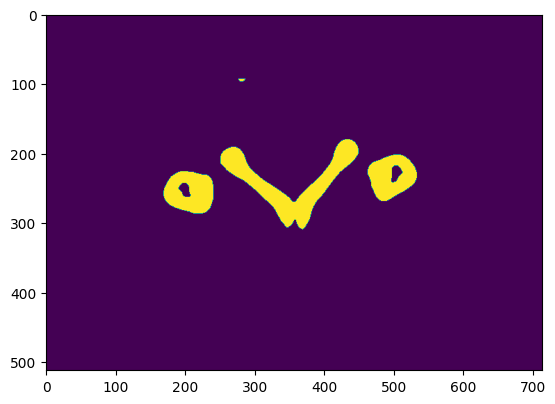

P_10255365_GIN.nrrd


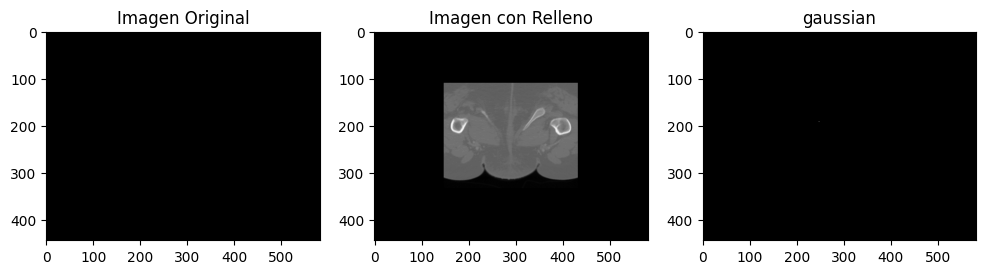

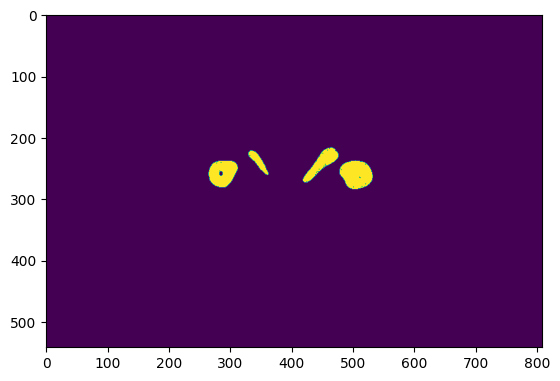

P_10273428_GIN.nrrd


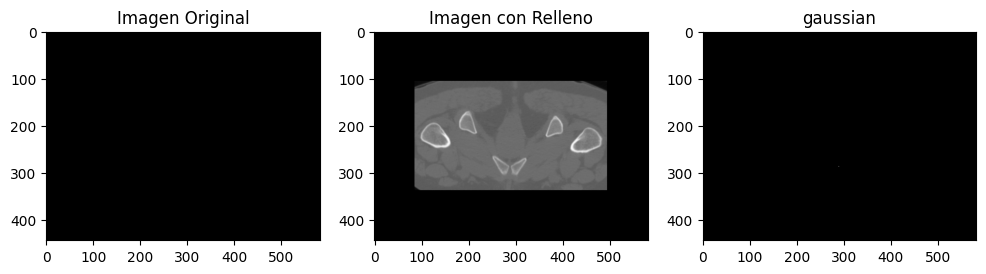

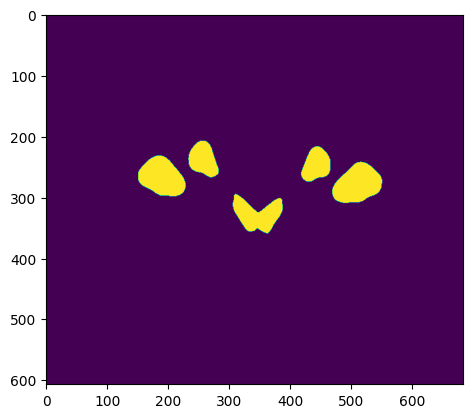

P_1663679_ANTROP.nrrd


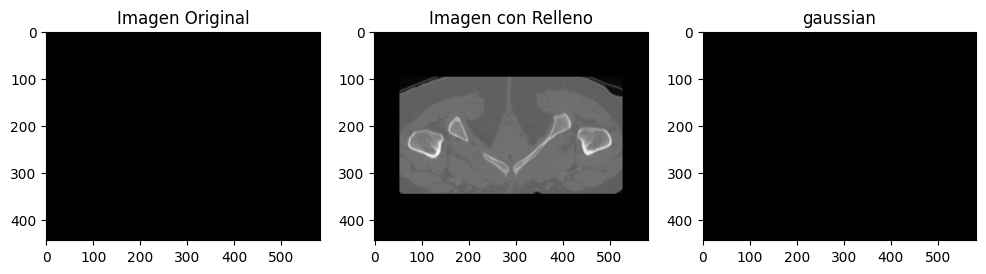

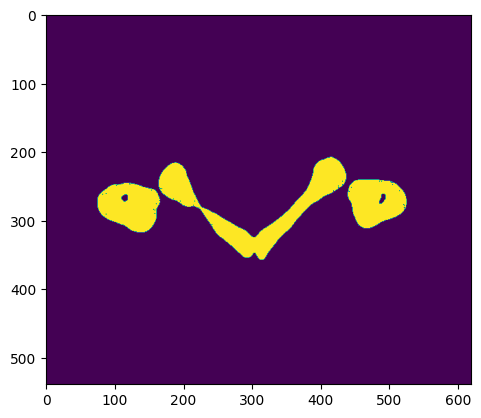

P_2046474_GIN.nrrd
P_1796248_ANTROP.nrrd


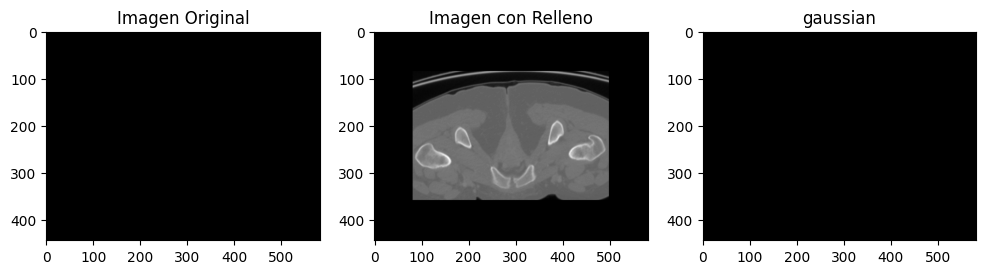

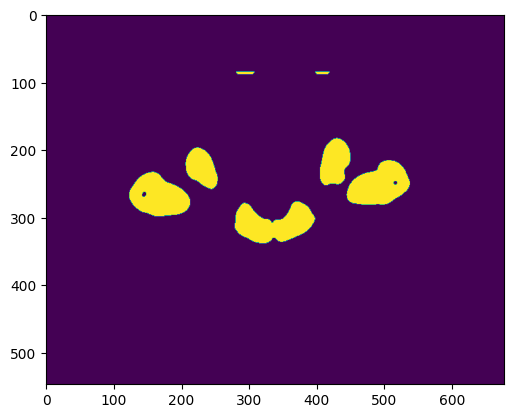

P_10240629_GIN.nrrd


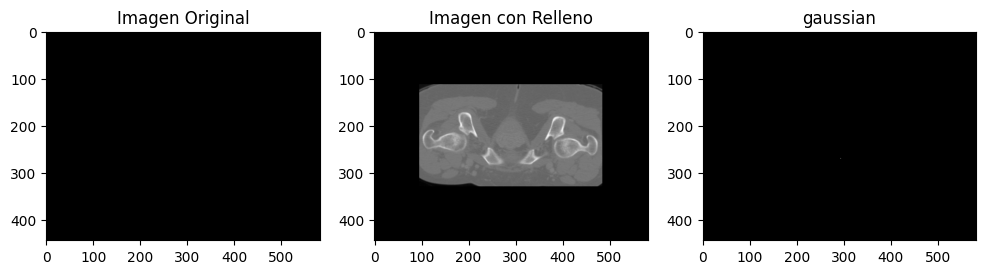

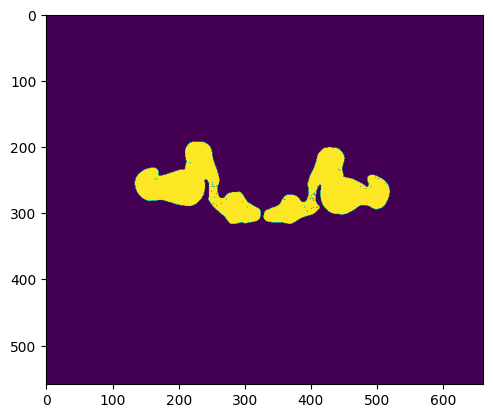

P_840131653_ANDRO.nrrd


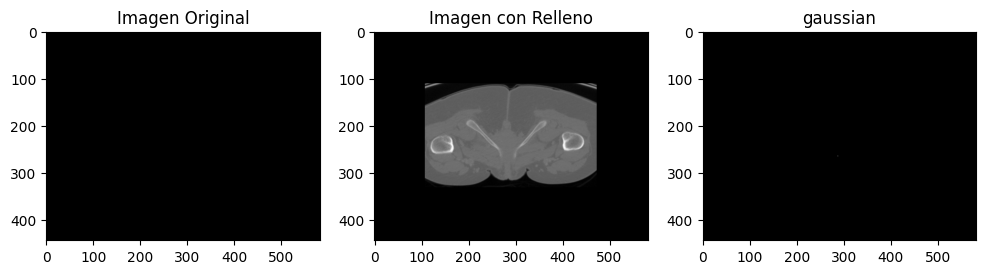

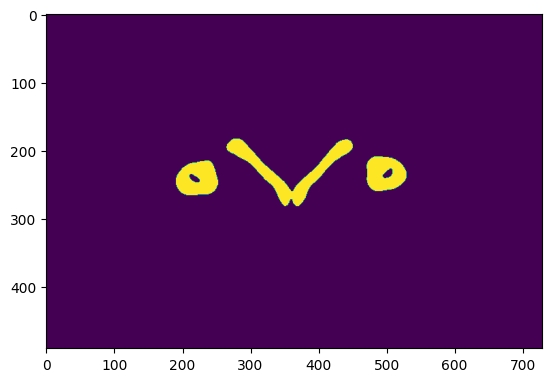

P_2089803_GIN.nrrd


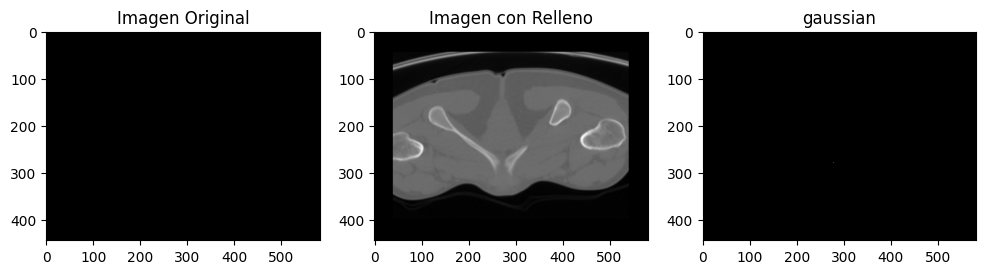

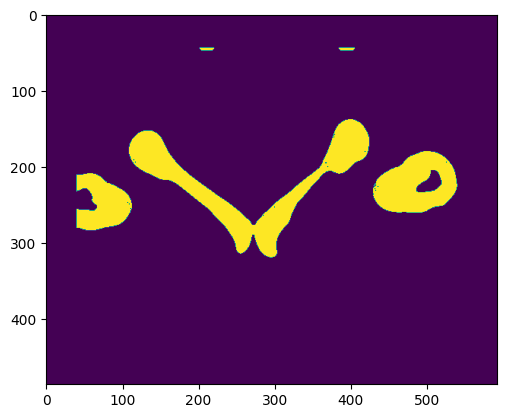

P_2114245_GIN.nrrd


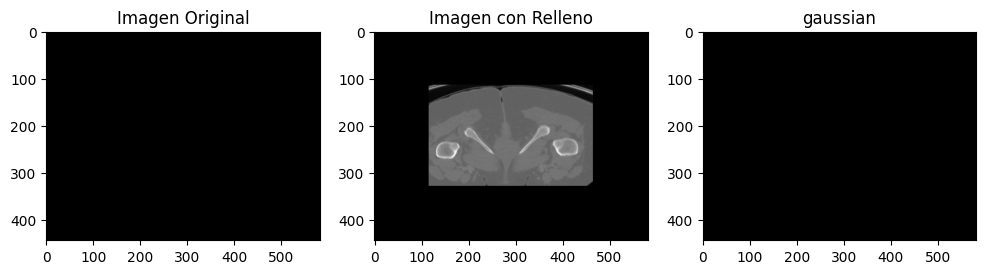

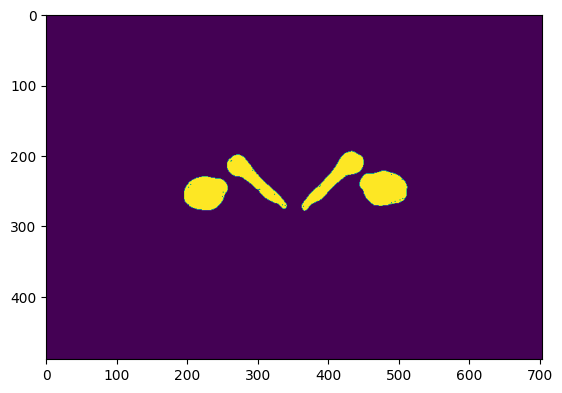

P_808475095_GIN.nrrd


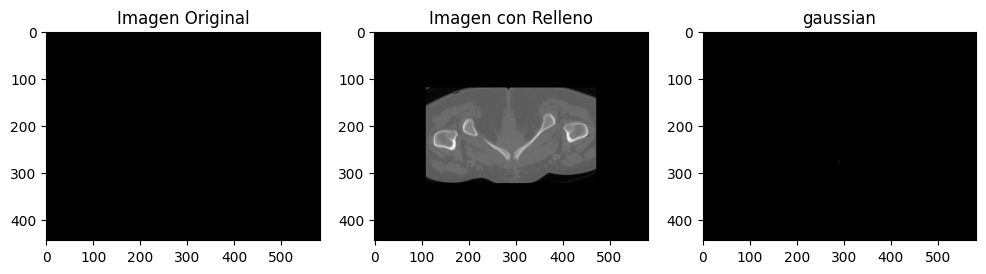

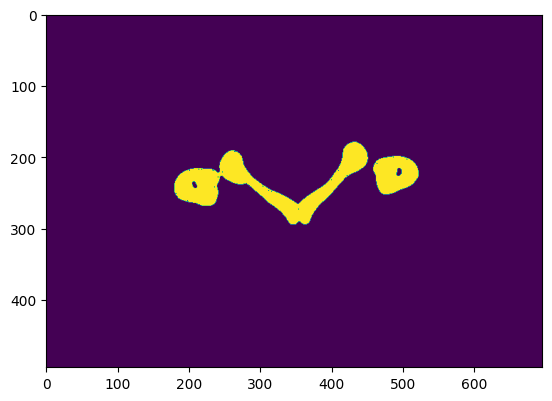

P_2133072_GIN.nrrd


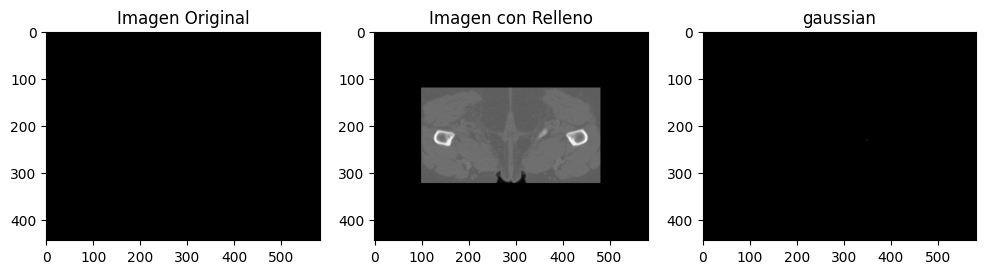

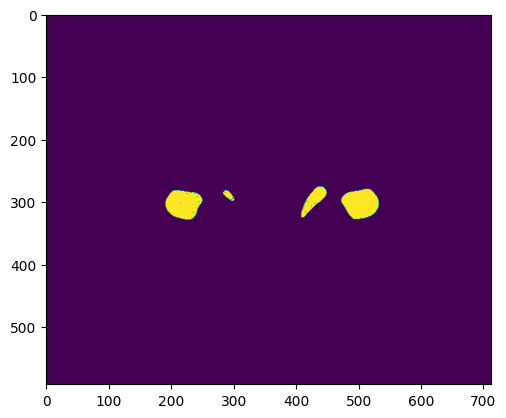

P_10643160_ANTROP.nrrd


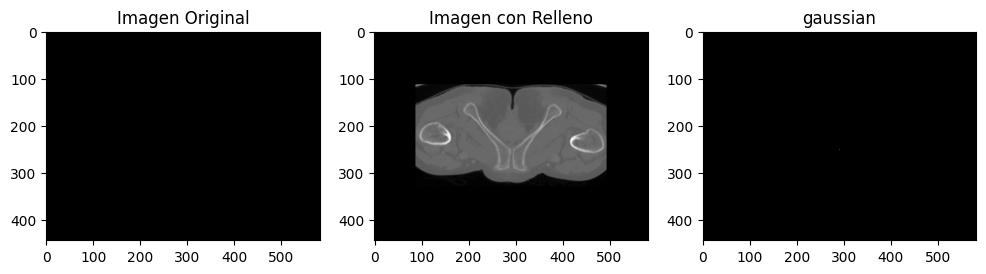

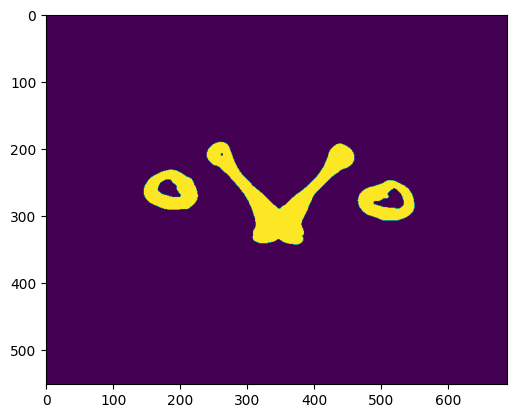

P_80411795_ANDRO.nrrd


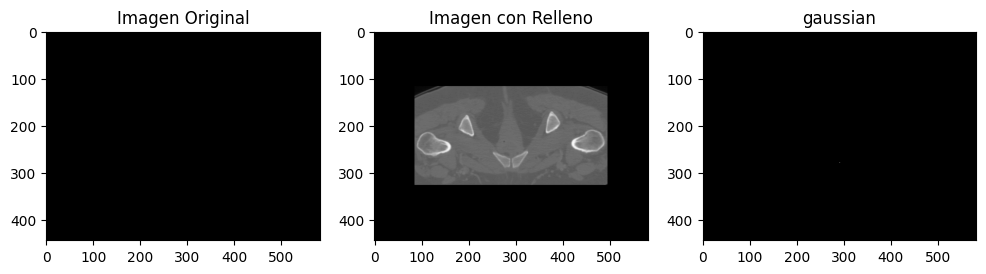

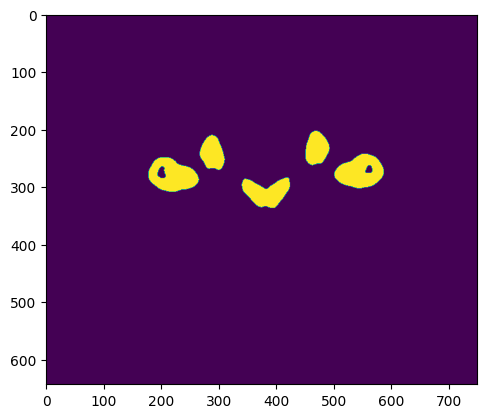

P_840057000_ANTROP.nrrd


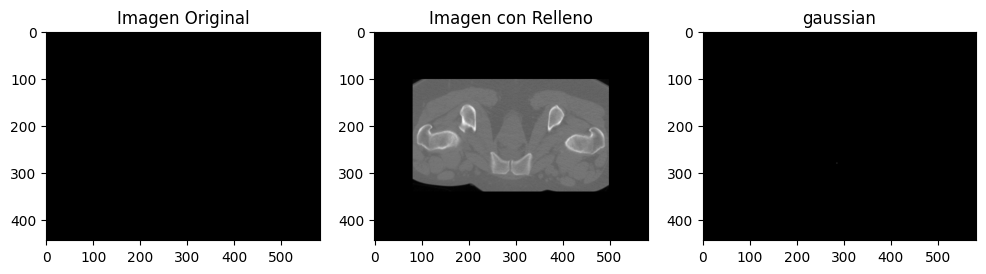

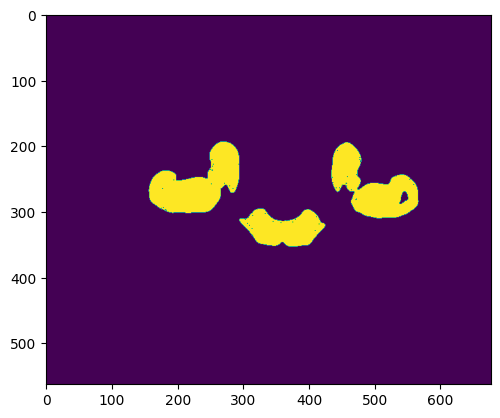

P_1059692_ANTROP.nrrd


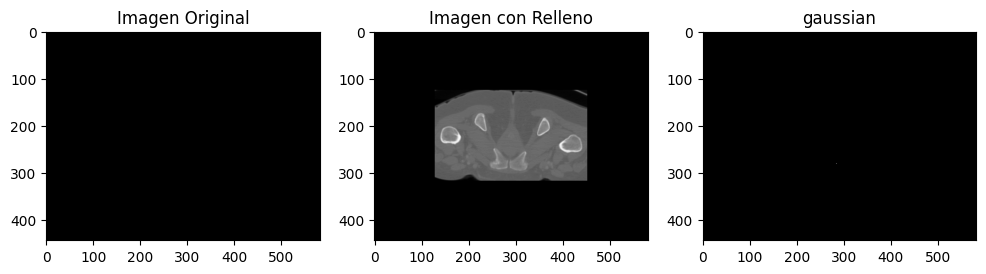

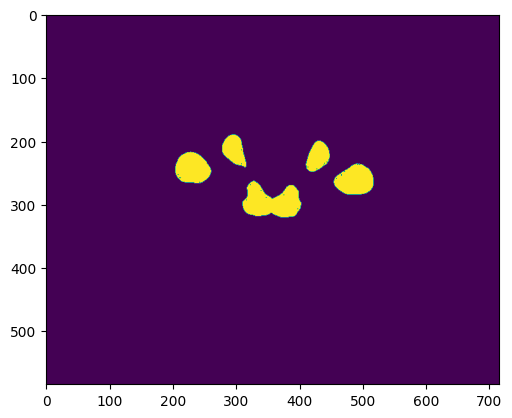

P_10040985_GIN.nrrd


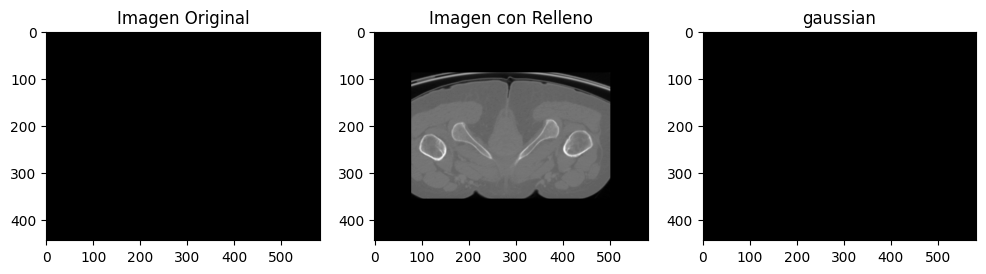

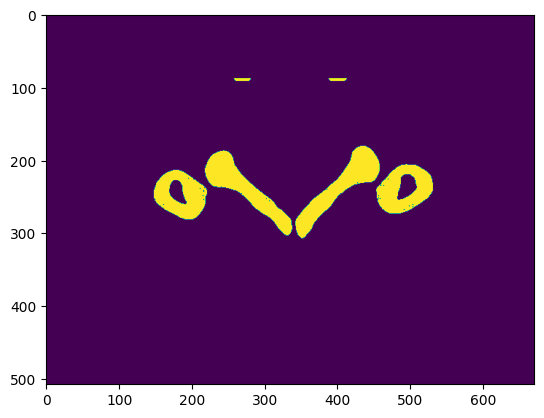

P_2207042_ANTROP.nrrd


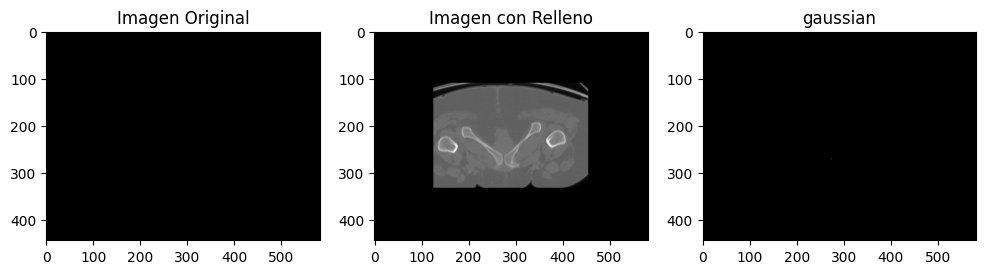

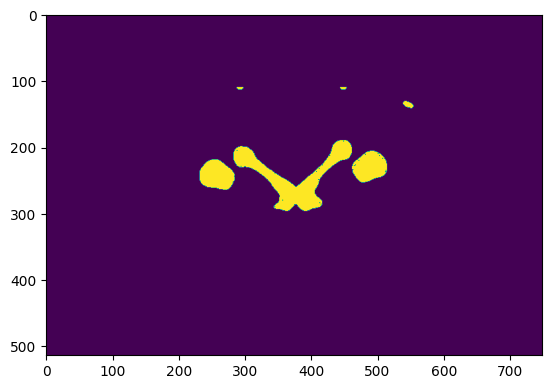

P_808761105_PLATI.nrrd


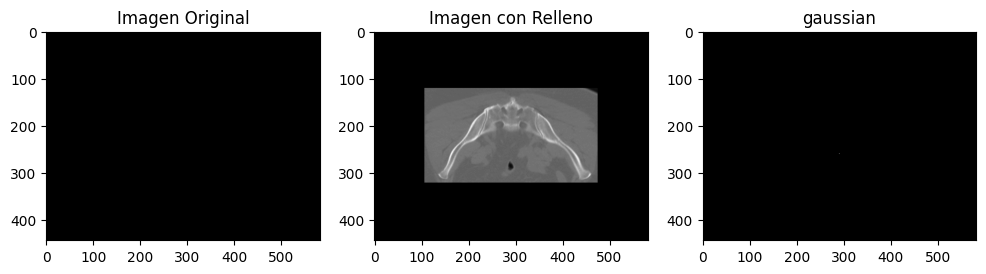

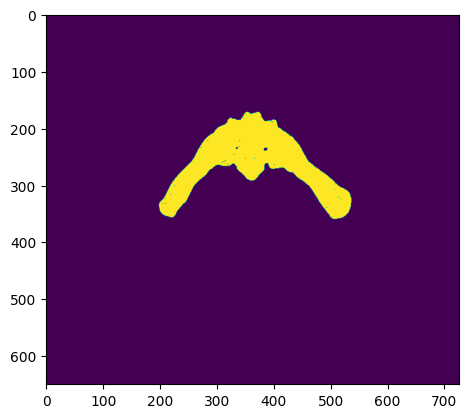

P_2170236-GIN.nrrd


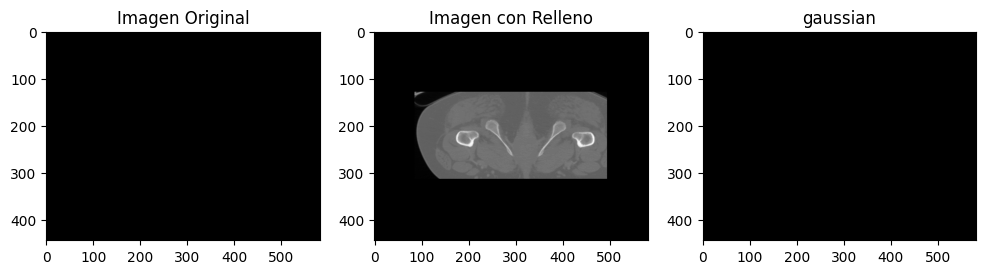

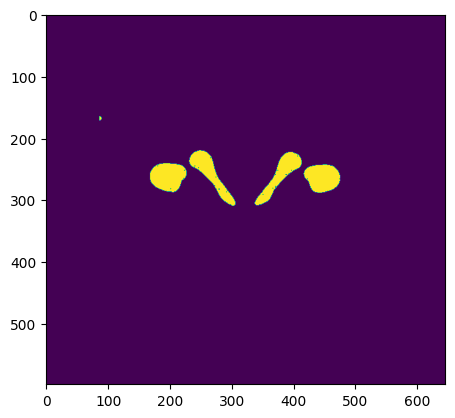

P_10034664_GIN.nrrd


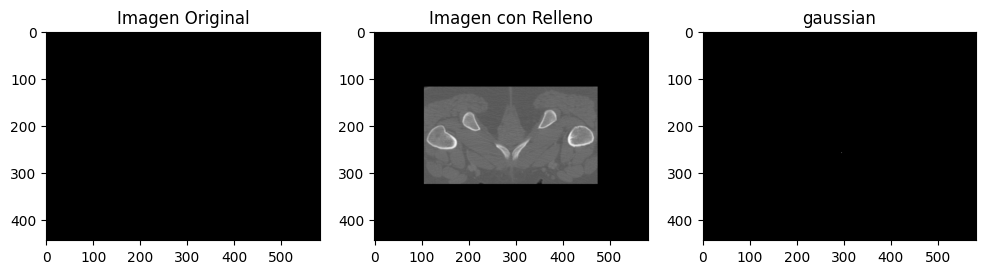

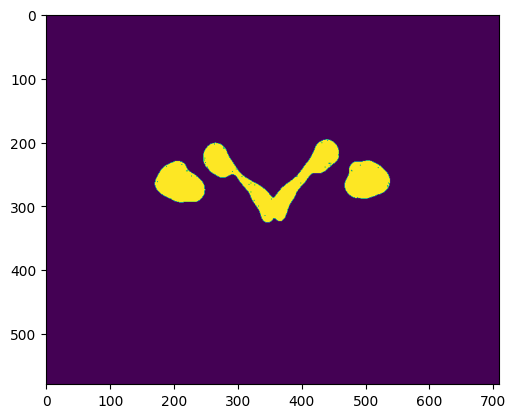

In [3]:
import SimpleITK as sitk
import os
import numpy as np
import matplotlib.pyplot as plt




def pad_images(image_folder, output_folder,landmarks_folder,save_landmarks_folder,gaussians_save, binary_mask_path):
    # Obtener el tamaño máximo necesario para el relleno
    # max_size = get_maximum_size(image_folder)
    max_size = [582,444,315]
    
    GAUSSIAN_IMAGES =[]
    PADDED_IMAGES = []
    # Asegurarse de que la carpeta de salida exista
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    if not os.path.exists(save_landmarks_folder):
        os.makedirs(save_landmarks_folder)
    if not os.path.exists(gaussians_save):
        os.makedirs(gaussians_save) 
    # Iterar sobre las imágenes y aplicar el relleno
    for image_file in os.listdir(image_folder):
        print(image_file)
        image_path = os.path.join(image_folder, image_file)
        
        gaussian_path = os.path.join(gaussians_save, image_file)
        landmarks_filename = f"{os.path.splitext(image_file)[0]}_landmarks.txt"
        landmarks_path = os.path.join(landmarks_folder, landmarks_filename)
        
        binary_mask_file = os.path.join(binary_mask_path, image_file)
        
        if (image_file != "padded" and image_file!="padded_landmarks" and image_file!="padded_gaussians"): 
            landmarks = np.loadtxt(landmarks_path)
            # print(landmarks[0])
            # Leer la imagen con SimpleITK
            image = sitk.ReadImage(image_path,sitk.sitkFloat32)
            # normalize image
            image_array = sitk.GetArrayFromImage(image)
            
            image_array_normalized = (image_array - image_array.min()) / (image_array.max()- image_array.min())
            image = sitk.GetImageFromArray(image_array_normalized)
            gaussian = sitk.ReadImage(gaussian_path, sitk.sitkFloat32)
            binary_mask = sitk.ReadImage(binary_mask_file, sitk.sitkFloat32)
            # Obtener el tamaño actual de la imagen
            current_size = np.array(image.GetSize())
            try:
                # Calcular la cantidad de relleno necesario
                padding_size = max_size - current_size
                
                # Aplicar el relleno
                # padding_size = np.maximum(padding_size - current_size, 0)
                
                # Compute the amount of padding needed for each dimension
                pad_x = int(padding_size[0])
                pad_y = int(padding_size[1])
                pad_z = int(padding_size[2])

                # Define the amount of padding for each side of the image
                lower_pad = (pad_x//2, pad_y//2, pad_z//2)
                upper_pad = (pad_x - lower_pad[0], pad_y - lower_pad[1], pad_z - lower_pad[2])
                
                # Create the filter for zero-padding the image
                padding_filter = sitk.ConstantPadImageFilter()

                # Set the padding value to 0
                padding_value = 0

                # Apply the padding filter to the input image
                padded_image = sitk.ConstantPad(image, lower_pad, upper_pad, padding_value)
                padded_image.SetOrigin(image.GetOrigin())
                
                padded_gaussian = sitk.ConstantPad(gaussian, lower_pad, upper_pad, padding_value)
                padded_gaussian.SetOrigin(gaussian.GetOrigin())
                
                padded_mask = sitk.ConstantPad(binary_mask, lower_pad, upper_pad, padding_value)
                padded_mask.SetOrigin(binary_mask.GetOrigin())
                
                gaussian_image = padded_gaussian
                
                # Guardar la imagen con relleno en la carpeta de salida
                output_path = os.path.join(output_folder, image_file)
                # sitk.WriteImage(padded_image, output_path)
                PADDED_IMAGES.append(padded_image)
                GAUSSIAN_IMAGES.append(gaussian_image)
                
                
                
            # RESIZE 
                image = padded_image
                gaussian = gaussian_image
                mask = padded_mask
                
                input_size = image.GetSize()
                gaussian_size = gaussian.GetSize()
                mask_size = mask.GetSize()

                # Define the new size of the image with reduced number of slices
                new_size = [input_size[0]//3, input_size[1]//3, input_size[2]//3] 
                new_gauss_size = [gaussian_size[0]//3, gaussian_size[1]//3, gaussian_size[2]//3] 
                new_mask_size = [mask_size[0]//3, mask_size[1]//3, mask_size[2]//3] 
                
                original_spacing = image.GetSpacing()
                original_gauss_spacing = gaussian.GetSpacing()
                original_mask_spacing = mask.GetSpacing()
                
                new_spacing = [image.GetSpacing()[0]*3, image.GetSpacing()[1]*3, image.GetSpacing()[2]*3] # change "*2" to the inverse of the reduction factor
                new_gauss_spacing = [gaussian.GetSpacing()[0]*3, gaussian.GetSpacing()[1]*3, gaussian.GetSpacing()[2]*3]
                new_mask_spacing = [mask.GetSpacing()[0]*3, mask.GetSpacing()[1]*3, mask.GetSpacing()[2]*3]
                
                final_transformed_resampled = sitk.Resample(image, new_size, sitk.Transform(), sitk.sitkLinear, image.GetOrigin(), new_spacing, image.GetDirection(), 0.0, image.GetPixelID())
                final_gaussian_resampled = sitk.Resample(gaussian, new_gauss_size, sitk.Transform(), sitk.sitkLinear, gaussian.GetOrigin(), new_gauss_spacing, gaussian.GetDirection(), 0.0, gaussian.GetPixelID())
                final_mask_resampled = sitk.Resample(mask, new_mask_size, sitk.Transform(), sitk.sitkLinear, mask.GetOrigin(), new_mask_spacing, mask.GetDirection(), 0.0, mask.GetPixelID())
                
            ## SAVE
                sitk.WriteImage(final_transformed_resampled, output_path)
                sitk.WriteImage((final_gaussian_resampled), gaussians_save +image_file )
                sitk.WriteImage(final_mask_resampled, binary_mask_path + image_file)
                
            
                # Visualizar la imagen original y la imagen con relleno
                plt.figure(figsize=(12, 6))
                
                plt.subplot(1, 3, 1)
                # plt.scatter(coordinate[0], coordinate[1], s=15, c='red', marker='o')
                # plt.imshow(sitk.GetArrayFromImage(image)[int(coordinate[2]), :, :], cmap='gray')
                
                plt.imshow(sitk.GetArrayFromImage(image)[22, :, :], cmap='gray')
                plt.title('Imagen Original')
                
                # Imagen con relleno
                plt.subplot(1, 3, 2)
                # plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=15, c='red', marker='o')
                # plt.imshow(sitk.GetArrayFromImage(padded_image)[int(coordinate[2])+lower_pad[2], :,:], cmap='gray')
                
                plt.imshow(sitk.GetArrayFromImage(padded_image)[22+lower_pad[2], :,:], cmap='gray')
                plt.title('Imagen con Relleno')
                
                # Gaussiana
                plt.subplot(1, 3, 3)
                # plt.scatter(landmarks_after_padding[0], landmarks_after_padding[1], s=15, c='red', marker='o')
                # plt.imshow(gaussian_image[int(coordinate[2])+lower_pad[2], :,:], cmap='gray')
                plt.imshow(sitk.GetArrayFromImage(gaussian_image)[22+lower_pad[2], :,:], cmap='gray')
                plt.title('gaussian')

                plt.show()
                
                plt.imshow(sitk.GetArrayFromImage(mask)[22+lower_pad[2],:,:])
                plt.show()
                
                
            except:
                pass
    return PADDED_IMAGES, GAUSSIAN_IMAGES
            
# Uso de la función
image_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/Cropped_images/"
output_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
save_landmarks_folder = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_landmarks/"
gaussians_save = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
binary_mask_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/BINARY_MASKS/"

PADDED_IMAGES, GAUSSIAN_IMAGES = pad_images(image_folder, output_folder,landmarks_folder,save_landmarks_folder,gaussians_save,binary_mask_path)

# Divide data

In [21]:
import os
images = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded/"
images_names = []
for i in os.listdir(images):
    images_names.append(images + i)

In [22]:
gaussians = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/ORIGINAL_IMAGES/padded_gaussians/"
gaussians_names = []
for i in os.listdir(gaussians):
    gaussians_names.append(gaussians + i)

In [23]:
from sklearn.model_selection import train_test_split
import pandas as pd

classes = []
for i in range(len(images_names)):
    
    if 'ANTRO' in images_names[i]:
        classes.append(0)
    elif 'ANDR' in images_names[i]:
        classes.append(1)
    elif 'GIN' in images_names[i]:
        classes.append(2)
    elif 'PLAT' in images_names[i]:
        classes.append(3)

print('Total:', pd.DataFrame(classes).value_counts())


X_train, X_test, Y_train, Y_test = train_test_split(images_names, gaussians_names, test_size=0.25, random_state=42, stratify = classes)


Total: 0    37
2    34
1     4
Name: count, dtype: int64


In [24]:
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)
y_train = Y_train

classes_train = []
for i in range(len(X_train)):
    if 'ANTRO' in X_train[i]:
        classes_train.append(0)
    elif 'ANDR' in X_train[i]:
        classes_train.append(1)
    elif 'GIN' in X_train[i]:
        classes_train.append(2)
    elif 'PLAT' in X_train[i]:
        classes_train.append(3)
print('\nTrain set:\n', pd.DataFrame(classes_train).value_counts())


classes_val = []
for i in range(len(Y_val)):
    if 'ANTRO' in Y_val[i]:
        classes_val.append(0)
    elif 'ANDR' in Y_val[i]:
        classes_val.append(1)
    elif 'GIN' in Y_val[i]:
        classes_val.append(2)
    elif 'PLAT' in Y_val[i]:
        classes_val.append(3)
print('\nValidation set:\n', pd.DataFrame(classes_val).value_counts())

classes_test = []
for i in range(len(X_test)):
    if 'ANTRO' in X_test[i]:
        classes_test.append(0)
    elif 'ANDR' in X_test[i]:
        classes_test.append(1)
    elif 'GIN' in X_test[i]:
        classes_test.append(2)
    elif 'PLAT' in X_test[i]:
        classes_test.append(3)

print('\nTest set:\n', pd.DataFrame(classes_test).value_counts())



Train set:
 0    21
2    19
1     2
Name: count, dtype: int64

Validation set:
 0    7
2    6
1    1
Name: count, dtype: int64

Test set:
 0    9
2    9
1    1
Name: count, dtype: int64


In [25]:
import shutil
import os

def copiar_imagenes(lista_imagenes, carpeta_destino):
    # Asegurarse de que la carpeta de destino exista
    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)

    for imagen in lista_imagenes:
        # Obtener el nombre del archivo
        nombre_archivo = os.path.basename(imagen)
        
        # Construir la ruta de destino
        destino = os.path.join(carpeta_destino, nombre_archivo)

        # Copiar el archivo
        shutil.copy(imagen, destino)


train_imagenes = X_train

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/train_files/images/"

copiar_imagenes(train_imagenes, carpeta_destino)


In [26]:


train_gauss= Y_train

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/train_files/landmarks/"

copiar_imagenes(train_gauss, carpeta_destino)

In [27]:
val_imagenes = X_val

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/val_files/images/"

copiar_imagenes(val_imagenes, carpeta_destino)

In [28]:

val_gaussians = Y_val

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/val_files/landmarks/"

copiar_imagenes(val_gaussians, carpeta_destino)

In [29]:
test_imagenes = X_test

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/test_files/images/"

copiar_imagenes(test_imagenes, carpeta_destino)

In [30]:
test_gaussians = Y_test

carpeta_destino = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/test_files/landmarks/"

copiar_imagenes(test_gaussians, carpeta_destino)

# MASKS

In [23]:
def plot_mask(mask_array):
    """Plots a mask array and enables slice selection."""

    slice_count = mask_array.shape[0]

    def update_slice(i):
        # Get the slice
        mask_slice = mask_array[i]

        # Convert the slice to a NumPy array for display
        mask_slice = mask_slice.astype(np.float32)

        # Plot the slice
        plt.imshow(mask_slice, cmap="Reds")
        plt.title(f"Slice {i + 1}")
        plt.axis("off")

    widgets.interact(update_slice, i=widgets.IntSlider(min=0, max=slice_count - 1, value=0))


In [24]:
binary_mask_path = "/home/paulagmtz/TFM_PAULA_24/DATA_TFM/BINARY_MASKS/"

for i in os.listdir(binary_mask_path):
    
    mask = sitk.ReadImage(binary_mask_path + i, sitk.sitkFloat32)
    mask_array = sitk.GetArrayFromImage(mask)
    plot_mask(mask_array)
    
    
    

interactive(children=(IntSlider(value=0, description='i', max=57), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=62), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=69), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=57), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=55), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=63), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=57), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=54), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=112), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=53), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=97), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=42), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=59), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=50), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=66), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=67), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=62), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=72), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=64), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=65), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=73), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=57), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=57), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=50), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=63), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=85), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=41), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=54), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=78), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=59), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=62), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=64), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=61), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=66), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=57), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=51), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=70), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=60), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=58), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=62), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=59), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=63), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=56), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=451), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=67), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=87), Output()), _dom_classes=('widget-interact',…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…

interactive(children=(IntSlider(value=0, description='i', max=104), Output()), _dom_classes=('widget-interact'…